# EDA of Pokedex Dataset

Pokedex in Pokemon games are devices that shows the information of the Pokemon species in this game. It shows the biodiversity within the game. Which provides good insights if one wishes to analyse battle data afterwards. A Pokedex usually has: 
* Pokemon name
* Species
* Category
* Height/ weight
* Stats (HP, attack, defence, special attack/ defence, speed)
* Abilities

This notebook has an exploratory data analysis of a Pokedex file. This contains all entries of all Pokemons, including the newest and their different forms. 

First, let us import all necessary libraries as below. 

In [1]:
from IPython.display import display

import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.gridspec as gridspec
import seaborn as sns

from scipy.stats import ttest_ind

In [2]:
pokedex_df = pd.read_csv('Pokemon_Gen_1-8.csv')

The dataset is stored in `pandas` data frame. To start, let us see what is in the first few rows. 

In [3]:
pokedex_df.head()

,#,Name,Type 1,Type 2,Category,Height,Weight,HP,Attack,Defense,Sp. Attack,Sp. Defense,Speed,Total,Average,Generation,Mythical,Legendary,Evolve From
0,1,Bulbasaur,Grass,Poison,Seed Pokemon,0.7,6.9,45,49,49,65,65,45,318,53.00,1.0,0.0,0.0,NaN
1,2,Ivysaur,Grass,Poison,Seed Pokemon,1.0,13.0,60,62,63,80,80,60,405,67.50,1.0,0.0,0.0,1.0
2,3,Venusaur,Grass,Poison,Seed Pokemon,2.0,100.0,80,82,83,100,100,80,525,87.50,1.0,0.0,0.0,2.0
3,3,Venusaur (Mega Venusaur),Grass,Poison,Seed Pokemon,2.4,155.5,80,100,123,122,120,80,625,104.17,1.0,0.0,0.0,2.0
4,3,Venusaur (Gigantamax),Grass,Poison,Seed Pokemon,24.0,0.0,80,82,83,100,100,80,525,87.50,NaN,NaN,NaN,NaN


In [4]:
pokedex_df.tail()

,#,Name,Type 1,Type 2,Category,Height,Weight,HP,Attack,Defense,Sp. Attack,Sp. Defense,Speed,Total,Average,Generation,Mythical,Legendary,Evolve From
1070,896,Glastrier,Ice,NaN,Wild Horse Pokemon,2.2,800.0,100,145,130,65,110,30,580,96.67,8.0,0.0,1.0,NaN
1071,897,Spectrier,Ghost,NaN,Swift Horse Pokemon,2.0,44.5,100,65,60,145,80,130,580,96.67,8.0,0.0,1.0,NaN
1072,898,Calyrex,Psychic,Grass,King Pokemon,1.1,7.7,100,80,80,80,80,80,500,83.33,8.0,0.0,1.0,NaN
1073,898,Calyrex (Ice Rider),Psychic,Ice,High King Pokemon,1.1,7.7,100,165,150,85,130,50,680,113.33,8.0,0.0,1.0,NaN
1074,898,Calyrex (Shadow Rider),Psychic,Dark,High King Pokemon,1.1,7.7,100,85,80,165,100,150,680,113.33,8.0,0.0,1.0,NaN


We can see that the forms are embedded within the names of the Pokemon. It is also apparent where Pokemons have 2 types, and some of them has 1 type. The `'Type 2'` column should have missing values. The middle of the columns are the core of the Pokedex: It contains useful information of each Pokemon and in particular how they may use in battles. The last 3 columns are catagorical features which contains information of the species' generation and whether they are mythical or legendary. 

We shall use these information in the subsequent analysis. 

# Pokedex Number

In [5]:
print(f'There are {pokedex_df["#"].unique().shape[0]} pokemons.')

There are 898 pokemons.


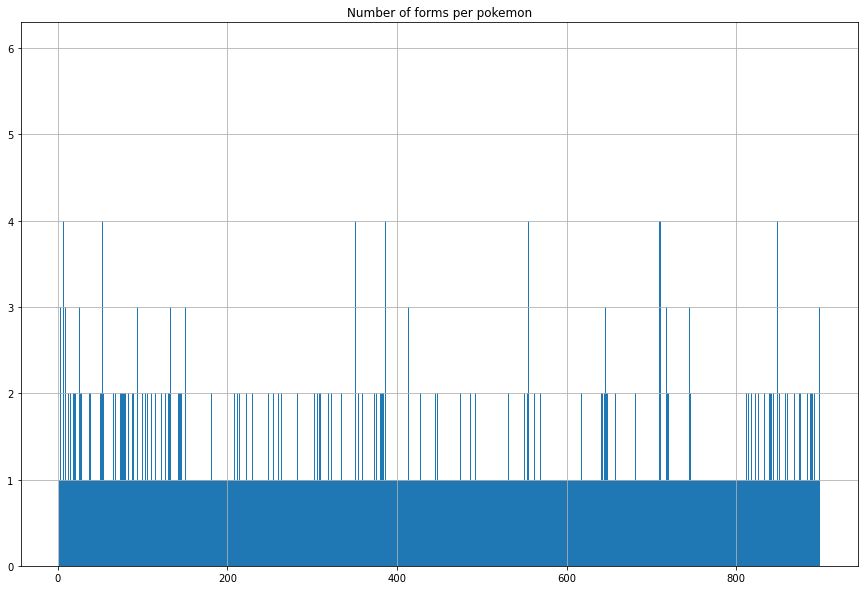

In [6]:
plt.figure(figsize=(15,10))
plt.title('Number of forms per pokemon')
pokedex_df["#"].hist(bins=pokedex_df["#"].unique().shape[0])
plt.show()

# Type

In [7]:
pokedex_df['Type 1'].unique()

array(['Grass', 'Fire', 'Water', 'Bug', 'Normal', 'Dark', 'Poison',
       'Electric', 'Ground', 'Ice', 'Fairy', 'Steel', 'Fighting',
       'Psychic', 'Rock', 'Ghost', 'Dragon', 'Flying'], dtype=object)

The type 1 and 2 are permutable, so we should combine them as new column. 

In [8]:
pokedex_df['Type 2'].fillna('', inplace=True)
# pokedex_df[['Type 1', 'Type 2']]

In [9]:
tmp_series = pokedex_df['Type 1'].str.cat(pokedex_df['Type 2'], sep=' ')
pokedex_df['Combined Type'] = [' '.join(sorted(x.split())) for x in tmp_series]

In [10]:
pokedex_df.groupby('Combined Type').mean()[['Height', 'Weight', 'HP', 'Attack', 'Defense', 'Sp. Attack', 'Sp. Defense', 'Speed']]

,Height,Weight,HP,Attack,Defense,Sp. Attack,Sp. Defense,Speed
Combined Type,,,,,,,,
Bug,0.557895,12.042105,51.263158,49.368421,55.105263,39.368421,44.842105,47.684211
Bug Electric,1.000000,27.750000,67.000000,76.000000,92.500000,100.000000,75.000000,39.500000
Bug Fairy,0.150000,0.350000,50.000000,50.000000,50.000000,75.000000,55.000000,104.000000
Bug Fighting,1.850000,118.775000,84.500000,146.500000,91.500000,67.500000,72.500000,97.500000
Bug Fire,16.280000,39.160000,78.000000,88.000000,59.000000,83.000000,78.000000,67.000000
...,...,...,...,...,...,...,...,...
Rock Steel,1.728571,272.357143,55.857143,78.571429,151.714286,52.428571,89.571429,33.285714
Rock Water,2.791667,38.575000,65.166667,84.416667,103.583333,63.333333,65.666667,52.916667
Steel,3.058333,195.541667,77.250000,97.750000,100.833333,62.083333,70.583333,44.000000


In [11]:
pokedex_df.groupby('Combined Type').std()[['Height', 'Weight', 'HP', 'Attack', 'Defense', 'Sp. Attack', 'Sp. Defense', 'Speed']]

,Height,Weight,HP,Attack,Defense,Sp. Attack,Sp. Defense,Speed
Combined Type,,,,,,,,
Bug,0.311476,12.606934,13.734960,27.512039,21.031444,20.835895,20.106006,33.396694
Bug Electric,0.707107,24.395184,14.142136,8.485281,3.535534,63.639610,0.000000,4.949747
Bug Fairy,0.070711,0.212132,14.142136,7.071068,14.142136,28.284271,21.213203,28.284271
Bug Fighting,0.387298,144.113621,15.588457,26.400758,44.911023,46.736852,32.675169,35.902646
Bug Fire,32.836976,49.190731,24.135037,26.362853,8.944272,35.284558,24.135037,20.186629
...,...,...,...,...,...,...,...,...
Rock Steel,1.761358,271.400797,12.785781,33.014427,37.800857,12.011899,42.871347,11.643514
Rock Water,6.686548,38.281781,22.217247,27.572906,19.383490,22.227474,14.723718,18.846067
Steel,6.350012,273.399263,31.883666,31.892219,52.365557,15.733337,29.754933,16.733201


In [12]:
pokedex_df['Combined Type'].value_counts().head(10)

Water            75
Normal           74
Grass            45
Psychic          44
Electric         34
Fire             34
Fighting         30
Flying Normal    27
Ice              21
Ground           20
Name: Combined Type, dtype: int64

In [13]:
pokedex_df['Combined Type'].value_counts().tail(10)

Electric Grass    1
Fire Steel        1
Electric Ghost    1
Fairy Ghost       1
Electric Fire     1
Fairy Poison      1
Fighting Rock     1
Poison Psychic    1
Fighting Ice      1
Poison Rock       1
Name: Combined Type, dtype: int64

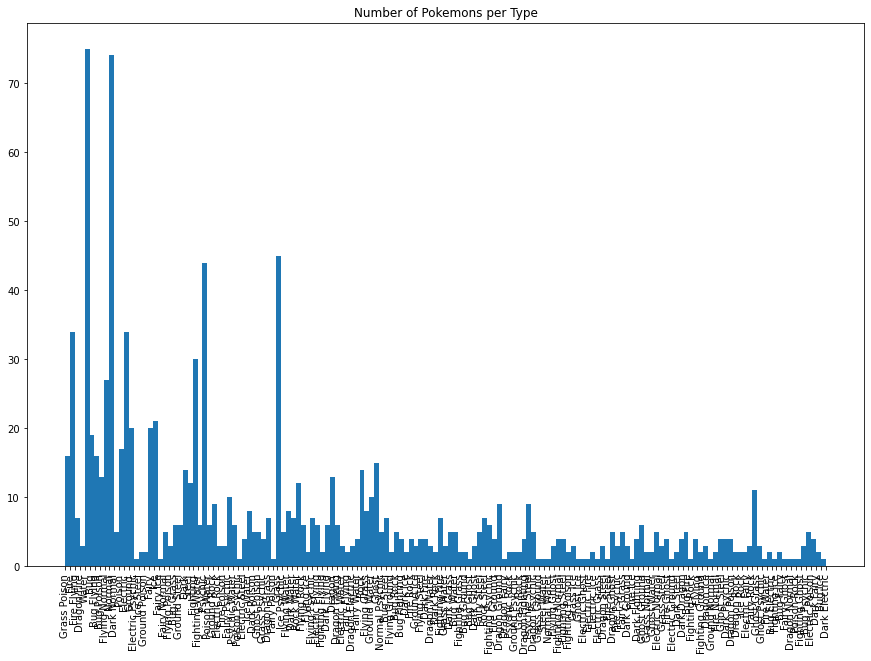

In [14]:
plt.figure(figsize=(15,10))
plt.hist(pokedex_df['Combined Type'], bins=pokedex_df['Combined Type'].unique().shape[0])
plt.xticks(rotation=90)
plt.title('Number of Pokemons per Type')
plt.show()

In [15]:
combined_type_data = pokedex_df.groupby('Combined Type').mean()[['Height', 'Weight', 'HP', 'Attack', 'Defense', 'Sp. Attack', 'Sp. Defense', 'Speed']]

width=5
height=31

In [16]:
# pokedex_df['Combined Type'].unique()
color_map = {'Grass Poison': '#4A6458', 'Fire': '#EF2D0F', 'Fire Flying': '#EAA07F', 'Dragon Fire': '#EA7F8A', 'Water': '#0770F4',
       'Bug': '#1F7427', 'Bug Flying': '#4FEEAC', 'Bug Poison': '#6A937B', 'Flying Normal': '#9DC5CF', 'Normal': '#B2A589',
       'Dark Normal': '#9C9B99', 'Poison': '#681F79', 'Electric': '#E3EE39', 'Ground': '#A6773A', 'Electric Psychic': '#786325',
       'Ice Steel': '#C5D3D3', 'Ground Poison': '#A3895F', 'Fairy': '#EF1B47', 'Ice': '#9AEAE9', 'Fairy Ice': '#F7CCDD',
       'Fairy Normal': '#E95791', 'Flying Poison': '#6797B7', 'Bug Grass': '#81FF44', 'Ground Steel': '#CB9058',
       'Dark': '#3D3A38', 'Steel': '#73A087', 'Fighting': '#B64A16', 'Fighting Water': '#B68516', 'Psychic': '#B22E62',
       'Poison Water': '#936EC6', 'Ground Rock': '#B5AC99', 'Electric Rock': '#ADA087', 'Fire Poison': '#9D7363',
       'Fairy Psychic': '#CE47AE', 'Psychic Water': '#E76FCA', 'Poison Psychic': '#DA32B1',
       'Electric Steel': '#FFF1BC', 'Ice Water': '#7BF6EB', 'Dark Poison': '#6536B0', 'Ghost Poison': '#323782',
       'Grass Psychic': '#328242', 'Dragon Grass': '#12A10B', 'Fairy Poison': '#A2406D', 'Grass': '#22E71F',
       'Ice Psychic': '#E7AEF6', 'Flying Water': '#78C3C7', 'Dark Water': '#556E78', 'Rock Water': '#4C5255',
       'Flying Rock': '#3D85A9', 'Flying Ice': '#5EC2F4', 'Flying Psychic': '#5E86F4', 'Electric Flying': '#E2E9BE',
       'Fighting Flying': '#EE1C28', 'Dark Flying': '#29324A', 'Dragon': '#3D9F8F', 'Dragon Flying': '#17C3EC',
       'Electric Water': '#AFC747', 'Fairy Flying': '#D368F6', 'Dragon Electric': '#DDD821', 'Fairy Water': '#BE76D6',
       'Rock': '#521F07', 'Flying Grass': '#30F196', 'Ground Water': '#13F67A', 'Ghost': '#460DBB', 'Normal Psychic': '#CB12EB',
       'Bug Steel': '#71A983', 'Flying Ground': '#FEC118', 'Bug Rock': '#9BAF48', 'Bug Fighting': '#9FC188',
       'Dark Ice': '#47685E', 'Fire Rock': '#685647', 'Ground Ice': '#F8E3B2', 'Flying Steel': '#A5D7D0', 'Dark Fire': '#454757',
       'Dragon Water': '#313343', 'Dark Rock': '#413F3D', 'Fighting Fire': '#FB3610', 'Grass Water': '#5FFB10',
       'Dark Grass': '#578F3C', 'Bug Water': '#3C8F78', 'Fighting Grass': '#09D54B', 'Bug Ground': '#228320',
       'Bug Ghost': '#A188C1', 'Dark Ghost': '#26283B', 'Fairy Steel': '#6E7584', 'Rock Steel': '#9C9DA0',
       'Fighting Psychic': '#9C59F6', 'Fire Ground': '#E66121', 'Dragon Ground': '#FA5405', 'Dragon Fairy': '#FA05E1',
       'Psychic Rock': '#8E8865', 'Ground Psychic': '#DCC22C', 'Grass Rock': '#9DBC8B', 'Dragon Fighting': '#E50B1E',
       'Psychic Steel': '#1774C7', 'Dragon Psychic': '#3E17C7', 'Grass Ground': '#79B73A', 'Steel Water': '#74D7EF',
       'Normal Water': '#23B6D8', 'Flying Ghost': '#BF813B', 'Fighting Normal': '#D08F47',
       'Fighting Steel': '#6CBA85', 'Fighting Poison': '#0DB824', 'Grass Ice': '#56F0B5', 'Ghost Ice': '#56A3F0',
       'Electric Ghost': '#8B8869', 'Electric Fire': '#D3B790', 'Electric Ice': '#F4F878',
       'Electric Grass': '#D7F622', 'Dragon Steel': '#1885E5', 'Fire Steel': '#F44203', 'Dragon Ghost': '#442F97',
       'Fire Psychic': '#FA650E', 'Fairy Grass': '#B6E37C', 'Dark Ground': '#8C6648', 'Fire Ice': '#E3AA7C',
       'Dark Fighting': '#251305', 'Ghost Ground': '#23F00B', 'Grass Normal': '#69D951', 'Ghost Water': '#C1D0D9',
       'Electric Normal': '#DADD6F', 'Grass Steel': '#A2D65B', 'Fire Ghost': '#EFA342', 'Electric Ground': '#C9DE10',
       'Dark Steel': '#5A6B68', 'Dark Dragon': '#5A6A6B', 'Bug Fire': '#EA531C', 'Fighting Rock': '#DE8850', 'Flying': '#688E86',
       'Fighting Ground': '#EA9E31', 'Dragon Ice': '#43AAC9', 'Ground Normal': '#D8A821', 'Fire Normal': '#EA5D31',
       'Ghost Steel': '#8B86A4', 'Dark Psychic': '#B7B1B6', 'Dragon Poison': '#CE07AD', 'Dragon Rock': '#B8A586',
       'Ice Rock': '#8F9FB2', 'Electric Fairy': '#D6E709', 'Fairy Rock': '#F0249C', 'Ghost Grass': '#60BA88',
       'Ghost Psychic': '#94A8F2', 'Fire Water': '#EED0C7', 'Bug Electric': '#D2E415', 'Fighting Ice': '#FBAE71',
       'Bug Fairy': '#D983E0', 'Fairy Ghost': '#C283E0', 'Dragon Normal': '#60E0C7', 'Poison Rock': '#B188C1',
       'Fighting Ghost': '#9ADEA5', 'Bug Psychic': '#6CB378', 'Electric Poison': '#B8B354', 'Dark Fairy': '#D82DCE', 'Bug Ice': '#08EF89', 'Dark Electric': '#9FA806'}

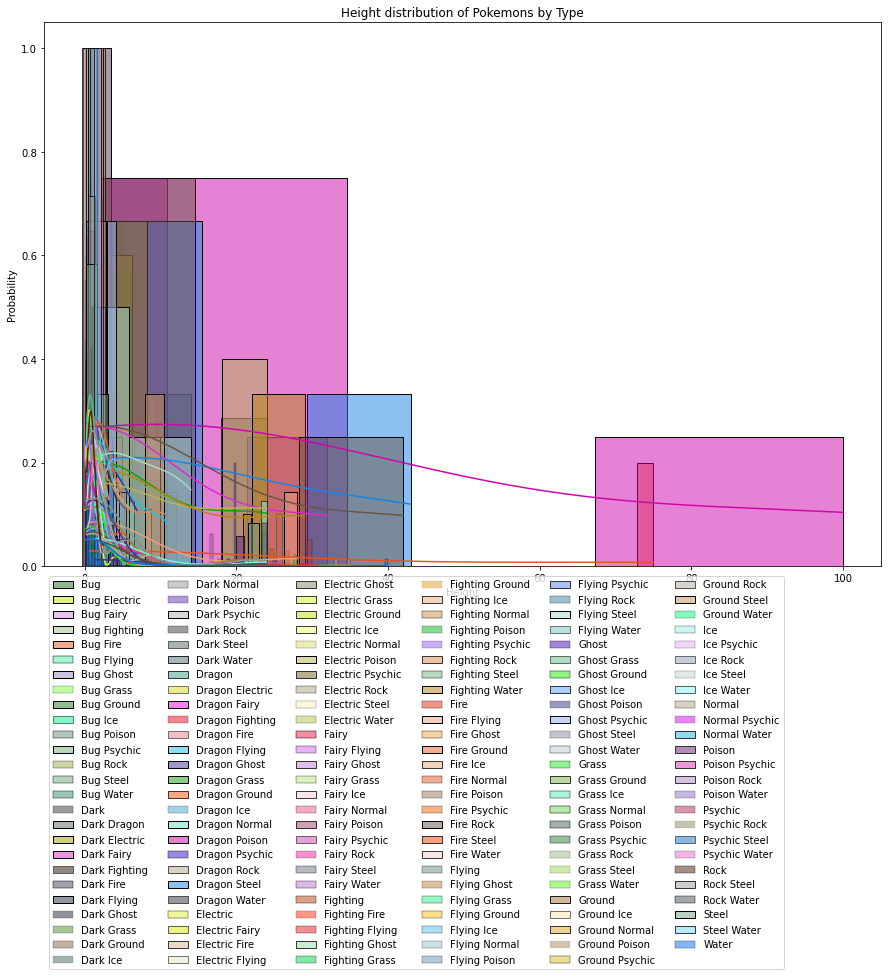

In [17]:
plt.figure(figsize=(15,10))
plt.title('Height distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['Height'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -0.75), loc='lower left')
plt.show()

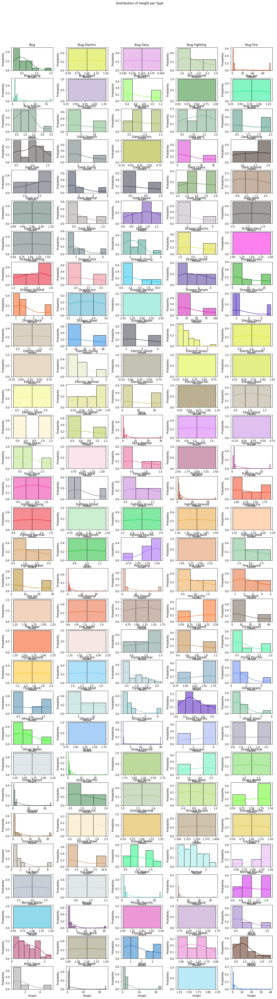

In [18]:
f, axes = plt.subplots(height,width,figsize=(15,55))
f.tight_layout()
plt.subplots_adjust(top=0.935)
axes = axes.flatten()

f.suptitle('Distribution of Height per Type')
for row in range(combined_type_data.shape[0]): 
    if not combined_type_data.iloc[row].isnull().values.any():
        # We can assume if there are missing values then no such combination exists. 
        ax = sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[row]._name]['Height'], ax=axes[row], kde=True, stat='probability', color=color_map[combined_type_data.iloc[row]._name])
        ax.set_title(combined_type_data.iloc[row]._name)
plt.show()
#         print(combined_type_data.iloc[row]._name)

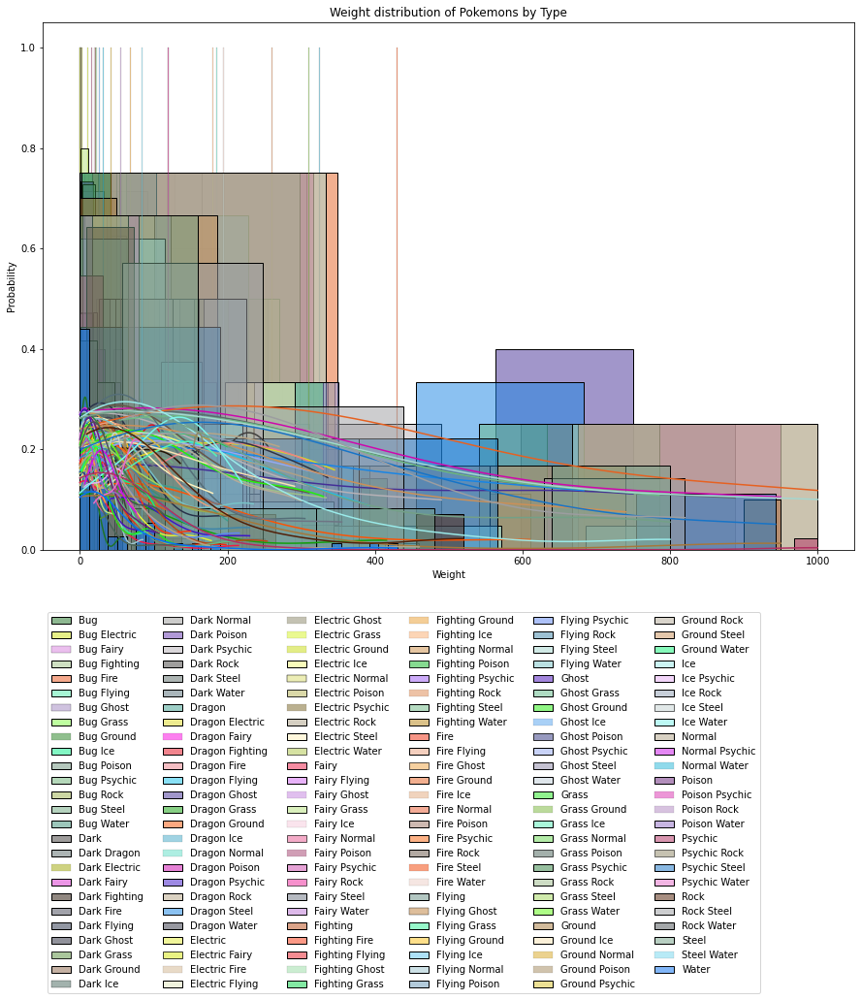

In [19]:
plt.figure(figsize=(15,10))
plt.title('Weight distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['Weight'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -0.85), loc='lower left')
plt.show()

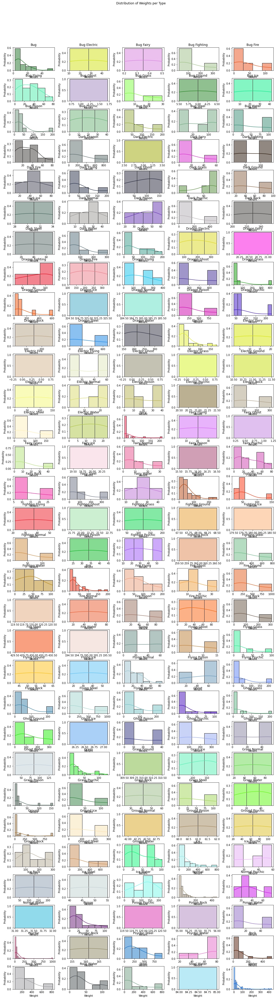

In [20]:
f, axes = plt.subplots(height,width,figsize=(15,55))
f.tight_layout()
plt.subplots_adjust(top=0.935)
axes = axes.flatten()

f.suptitle('Distribution of Weights per Type')
for row in range(combined_type_data.shape[0]): 
    if not combined_type_data.iloc[row].isnull().values.any():
        # We can assume if there are missing values then no such combination exists. 
        ax = sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[row]._name]['Weight'], ax=axes[row], kde=True, stat='probability', color=color_map[combined_type_data.iloc[row]._name])
        ax.set_title(combined_type_data.iloc[row]._name)
plt.show()

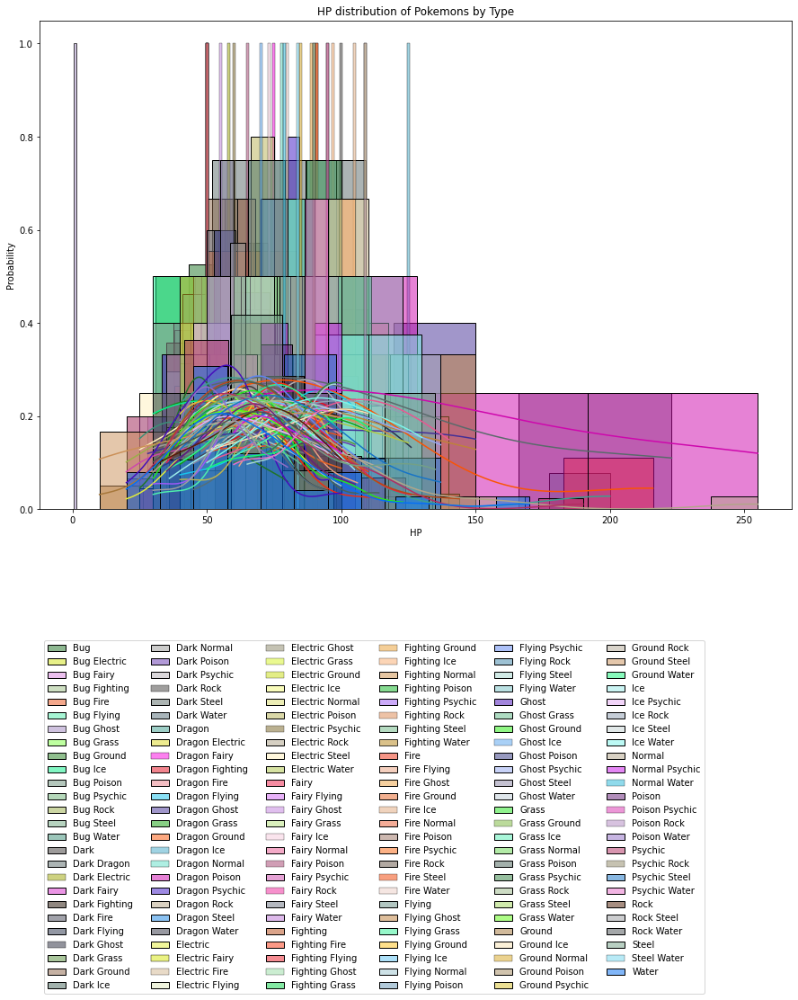

In [21]:
plt.figure(figsize=(15,10))
plt.title('HP distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['HP'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -1), loc='lower left')
plt.show()

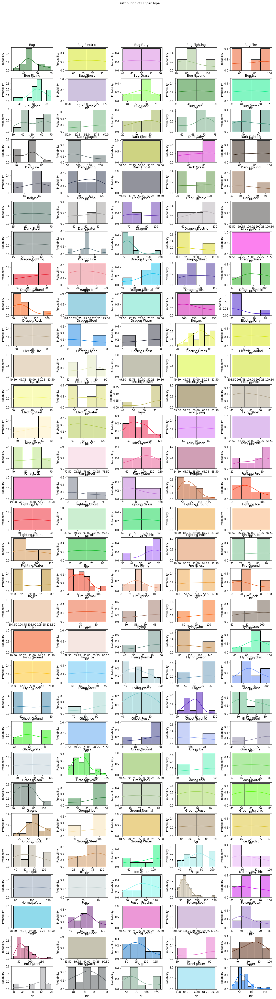

In [22]:
f, axes = plt.subplots(height,width,figsize=(15,55))
f.tight_layout()
plt.subplots_adjust(top=0.935)
axes = axes.flatten()

f.suptitle('Distribution of HP per Type')
for row in range(combined_type_data.shape[0]): 
    if not combined_type_data.iloc[row].isnull().values.any():
        # We can assume if there are missing values then no such combination exists. 
        ax = sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[row]._name]['HP'], ax=axes[row], kde=True, stat='probability', color=color_map[combined_type_data.iloc[row]._name])
        ax.set_title(combined_type_data.iloc[row]._name)
plt.show()

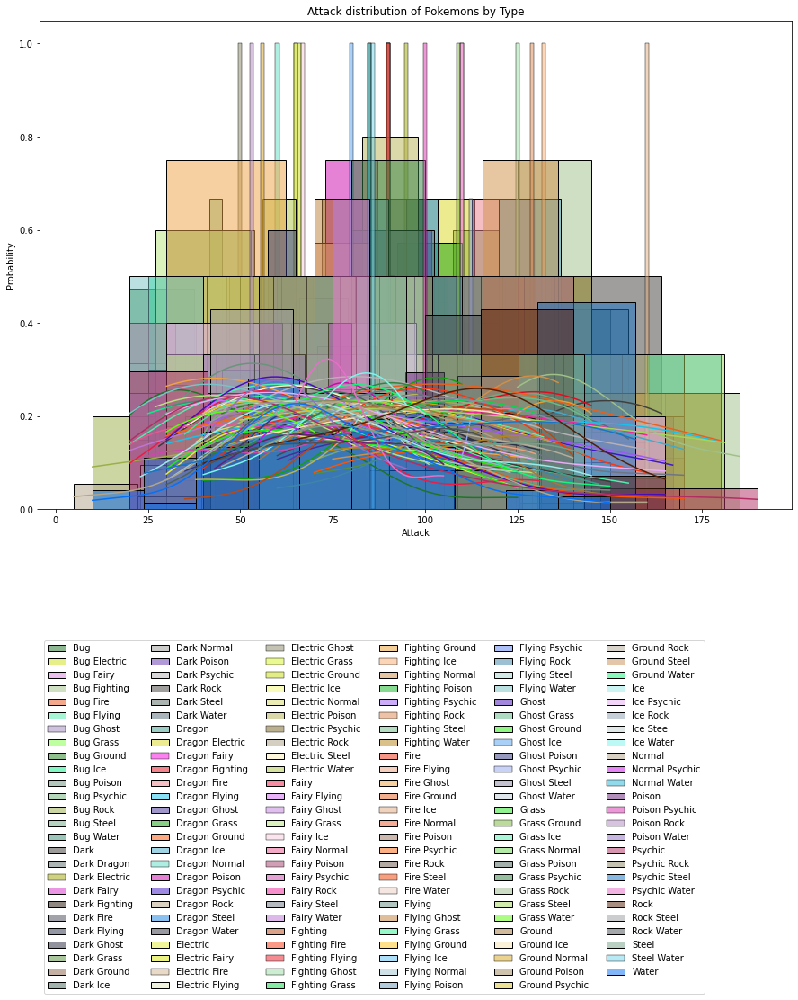

In [23]:
plt.figure(figsize=(15,10))
plt.title('Attack distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['Attack'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -1), loc='lower left')
plt.show()

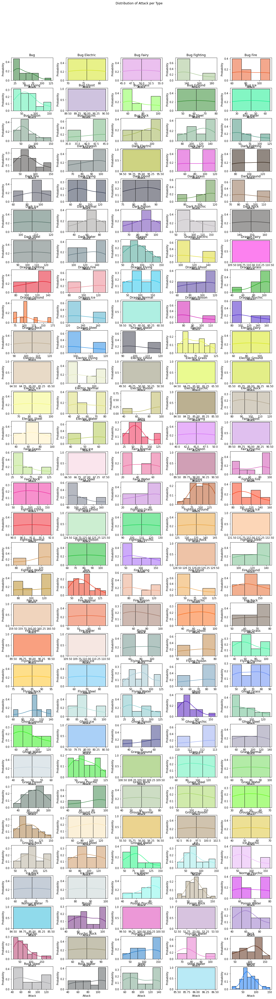

In [24]:
f, axes = plt.subplots(height,width,figsize=(15,55))
f.tight_layout()
plt.subplots_adjust(top=0.925)
axes = axes.flatten()

f.suptitle('Distribution of Attack per Type')
for row in range(combined_type_data.shape[0]): 
    if not combined_type_data.iloc[row].isnull().values.any():
        # We can assume if there are missing values then no such combination exists. 
        ax = sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[row]._name]['Attack'], ax=axes[row], kde=True, stat='probability', color=color_map[combined_type_data.iloc[row]._name])
        ax.set_title(combined_type_data.iloc[row]._name)
plt.show()

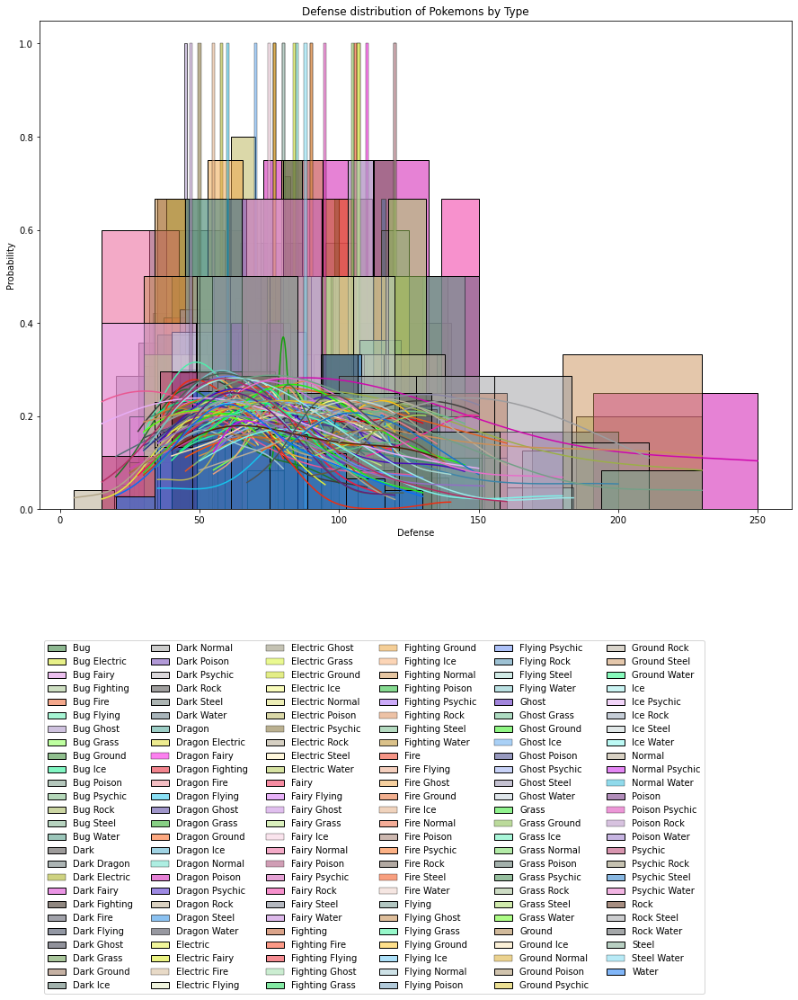

In [25]:
plt.figure(figsize=(15,10))
plt.title('Defense distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['Defense'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -1), loc='lower left')
plt.show()

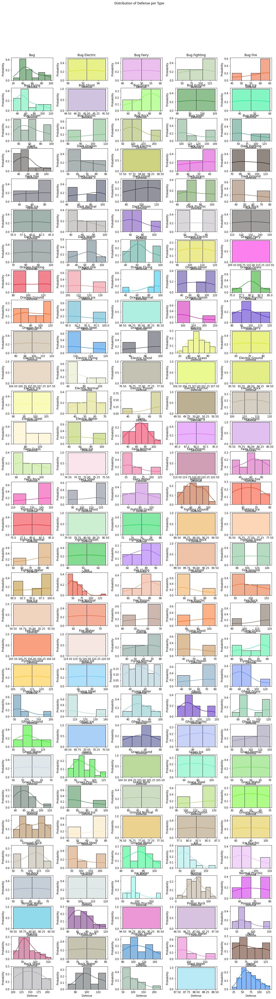

In [26]:
f, axes = plt.subplots(height,width,figsize=(15,55))
f.tight_layout()
plt.subplots_adjust(top=0.925)
axes = axes.flatten()

f.suptitle('Distribution of Defense per Type')
for row in range(combined_type_data.shape[0]): 
    if not combined_type_data.iloc[row].isnull().values.any():
        # We can assume if there are missing values then no such combination exists. 
        ax = sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[row]._name]['Defense'], ax=axes[row], kde=True, stat='probability', color=color_map[combined_type_data.iloc[row]._name])
        ax.set_title(combined_type_data.iloc[row]._name)
plt.show()

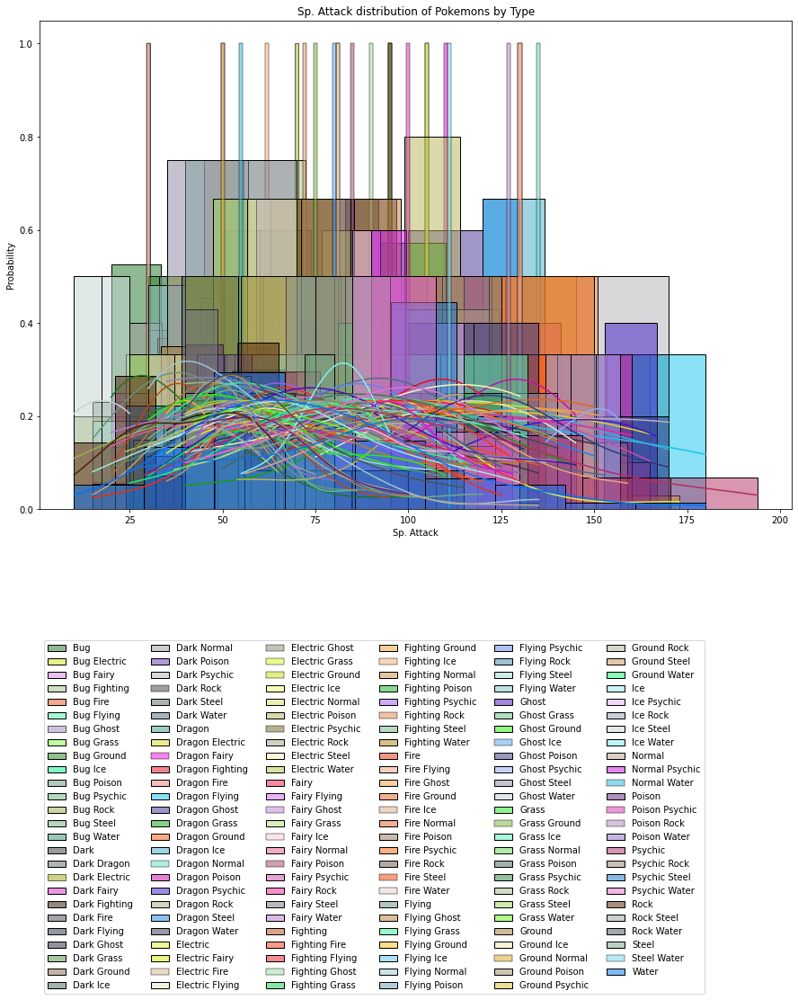

In [27]:
plt.figure(figsize=(15,10))
plt.title('Sp. Attack distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['Sp. Attack'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -1), loc='lower left')
plt.show()

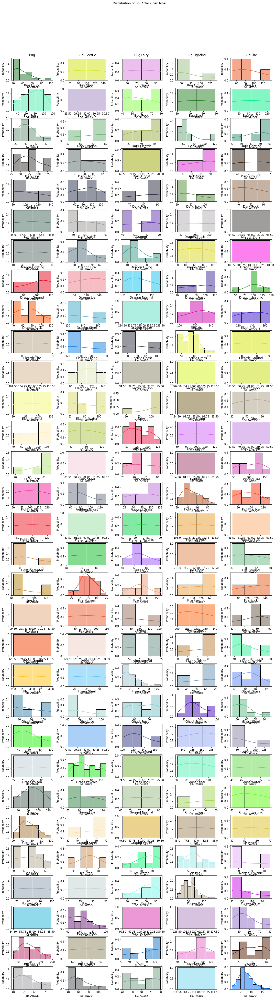

In [28]:
f, axes = plt.subplots(height,width,figsize=(15,55))
f.tight_layout()
plt.subplots_adjust(top=0.925)
axes = axes.flatten()

f.suptitle('Distribution of Sp. Attack per Type')
for row in range(combined_type_data.shape[0]): 
    if not combined_type_data.iloc[row].isnull().values.any():
        # We can assume if there are missing values then no such combination exists. 
        ax = sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[row]._name]['Sp. Attack'], ax=axes[row], kde=True, stat='probability', color=color_map[combined_type_data.iloc[row]._name])
        ax.set_title(combined_type_data.iloc[row]._name)
plt.show()

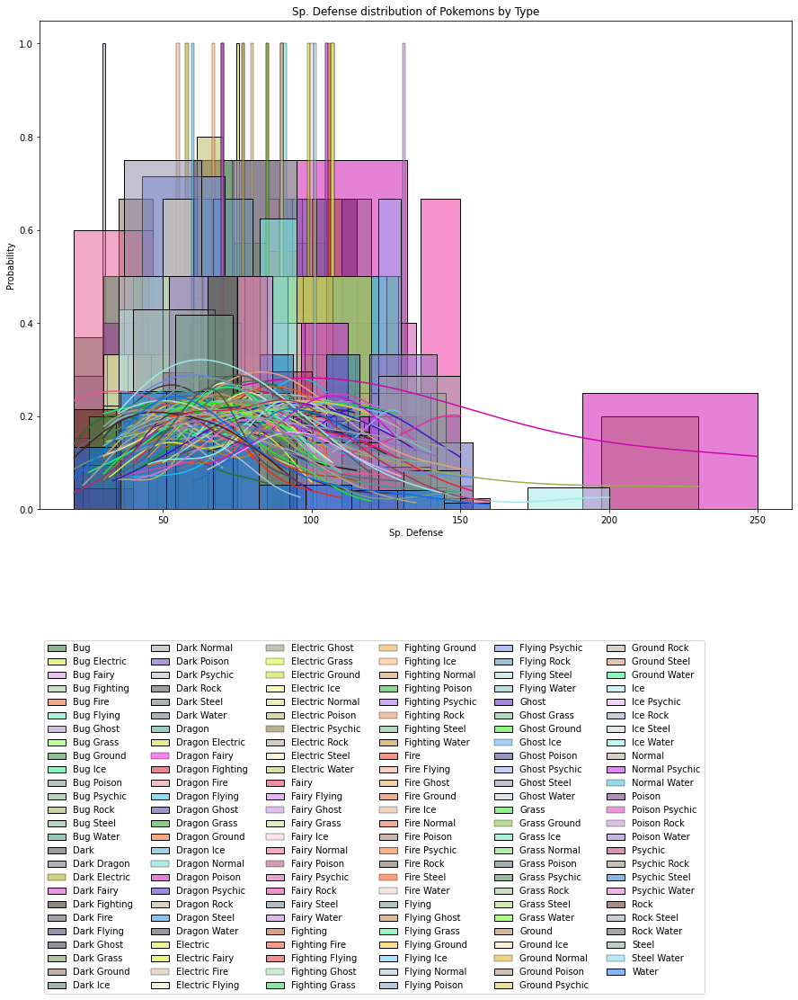

In [29]:
plt.figure(figsize=(15,10))
plt.title('Sp. Defense distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['Sp. Defense'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -1), loc='lower left')
plt.show()

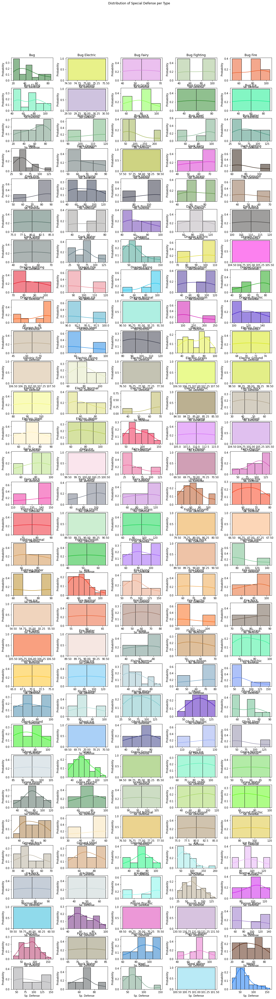

In [30]:
f, axes = plt.subplots(height,width,figsize=(15,55))
f.tight_layout()
plt.subplots_adjust(top=0.925)
axes = axes.flatten()

f.suptitle('Distribution of Special Defense per Type')
for row in range(combined_type_data.shape[0]): 
    if not combined_type_data.iloc[row].isnull().values.any():
        # We can assume if there are missing values then no such combination exists. 
        ax = sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[row]._name]['Sp. Defense'], ax=axes[row], kde=True, stat='probability', color=color_map[combined_type_data.iloc[row]._name])
        ax.set_title(combined_type_data.iloc[row]._name)
plt.show()

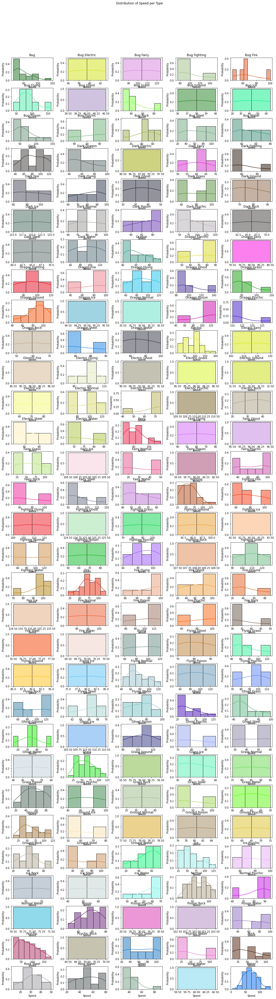

In [31]:
f, axes = plt.subplots(height,width,figsize=(15,55))
f.tight_layout()
plt.subplots_adjust(top=0.925)
axes = axes.flatten()

f.suptitle('Distribution of Speed per Type')
for row in range(combined_type_data.shape[0]): 
    if not combined_type_data.iloc[row].isnull().values.any():
        # We can assume if there are missing values then no such combination exists. 
        ax = sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[row]._name]['Speed'], ax=axes[row], kde=True, stat='probability', color=color_map[combined_type_data.iloc[row]._name])
        ax.set_title(combined_type_data.iloc[row]._name)
plt.show()

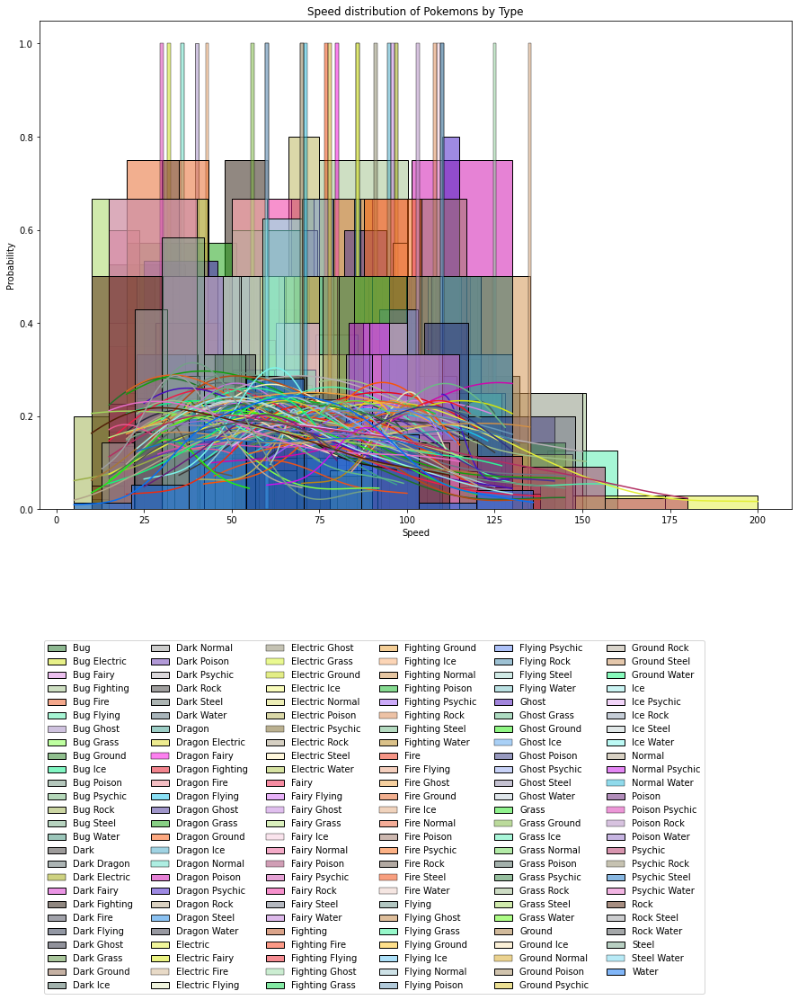

In [32]:
plt.figure(figsize=(15,10))
plt.title('Speed distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['Speed'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -1), loc='lower left')
plt.show()

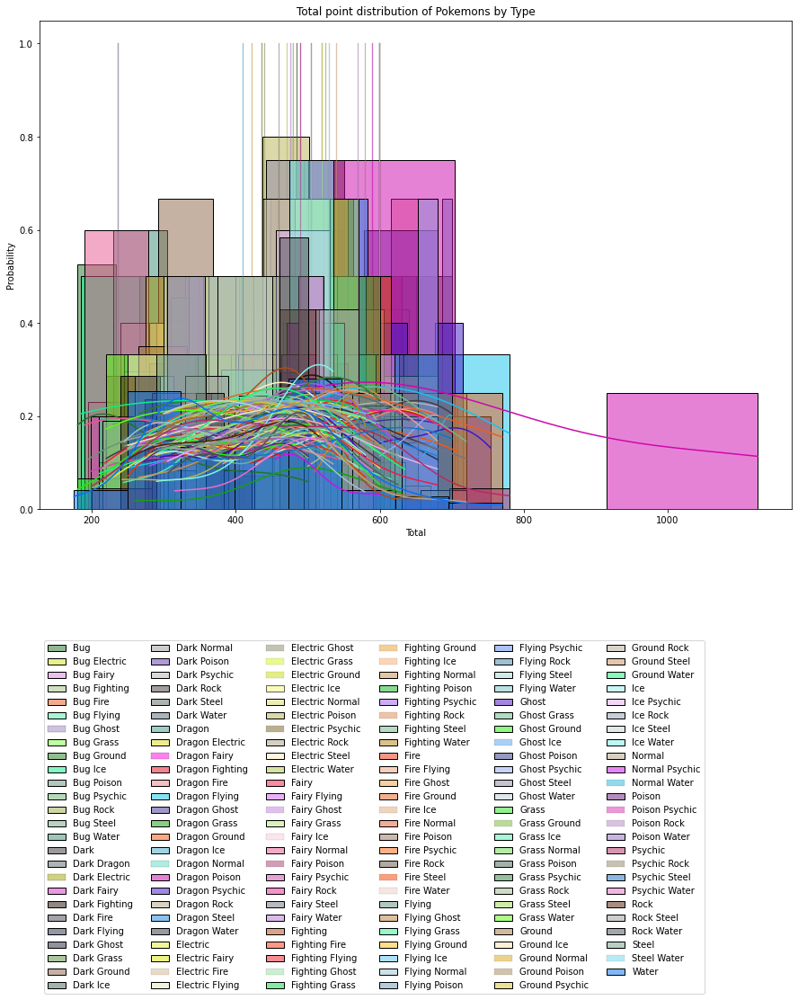

In [33]:
plt.figure(figsize=(15,10))
plt.title('Total point distribution of Pokemons by Type')
for species in range(combined_type_data.shape[0]): 
    sns.histplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name]['Total'], 
                 kde=True, stat='probability', label=combined_type_data.iloc[species]._name, color=color_map[combined_type_data.iloc[species]._name])
plt.legend(ncol=6, bbox_to_anchor=(0, -1), loc='lower left')
plt.show()

## Effect of Combined Type

In [34]:
def show_pure_type(type_name, value='Total'): 
    plt.figure(figsize=(15,10))
    if value == 'Total': 
        plt.title(f'Total point distribution of {type_name} Pokemons')
    else: 
        plt.title(f'{value} distribution of {type_name} Pokemons')
    for species in range(combined_type_data.shape[0]): 
        if type_name in combined_type_data.iloc[species]._name: 
            if type_name == combined_type_data.iloc[species]._name: 
                ax = sns.kdeplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name][value],
                                 label=combined_type_data.iloc[species]._name,
                                 color=color_map[combined_type_data.iloc[species]._name]
                                 ,fill=color_map[combined_type_data.iloc[species]._name])
            else: 
                ax = sns.kdeplot(x=pokedex_df[pokedex_df['Combined Type'] == combined_type_data.iloc[species]._name][value],
                                 label=combined_type_data.iloc[species]._name,
                                 color=color_map[combined_type_data.iloc[species]._name])
    plt.legend()
    plt.show()

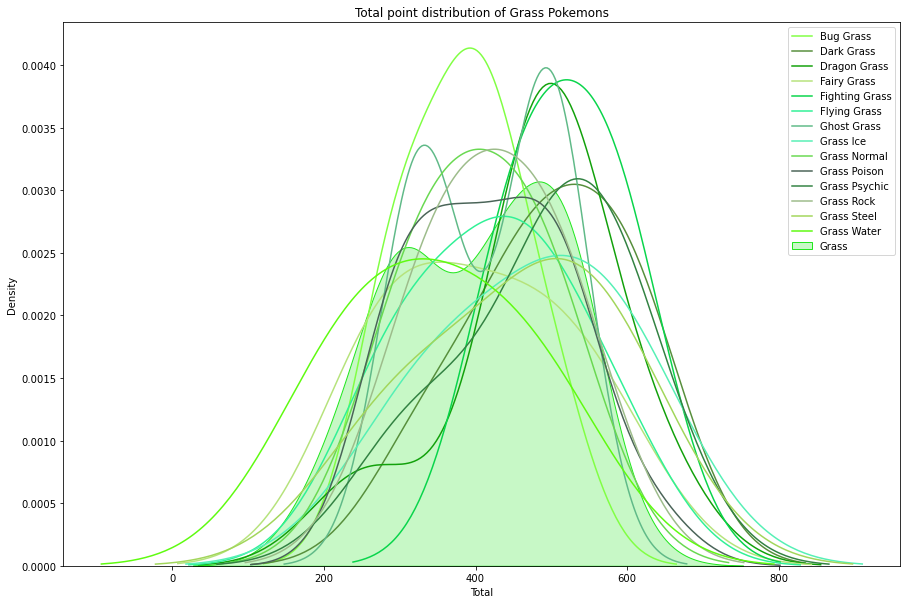

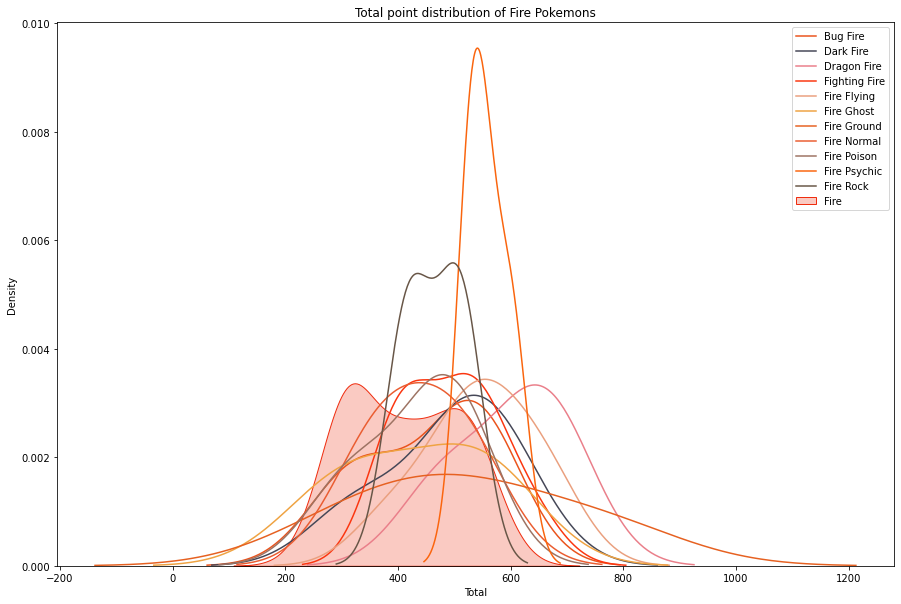

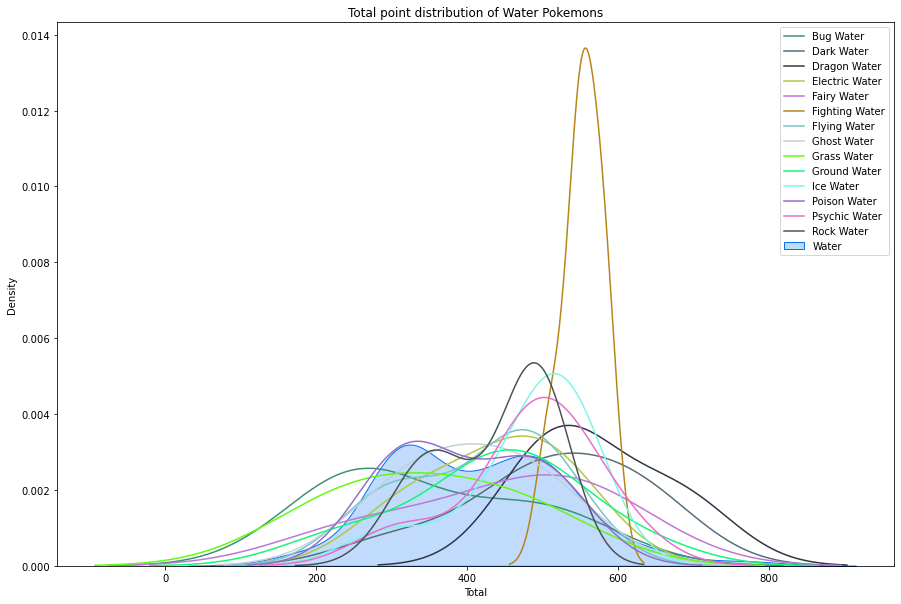

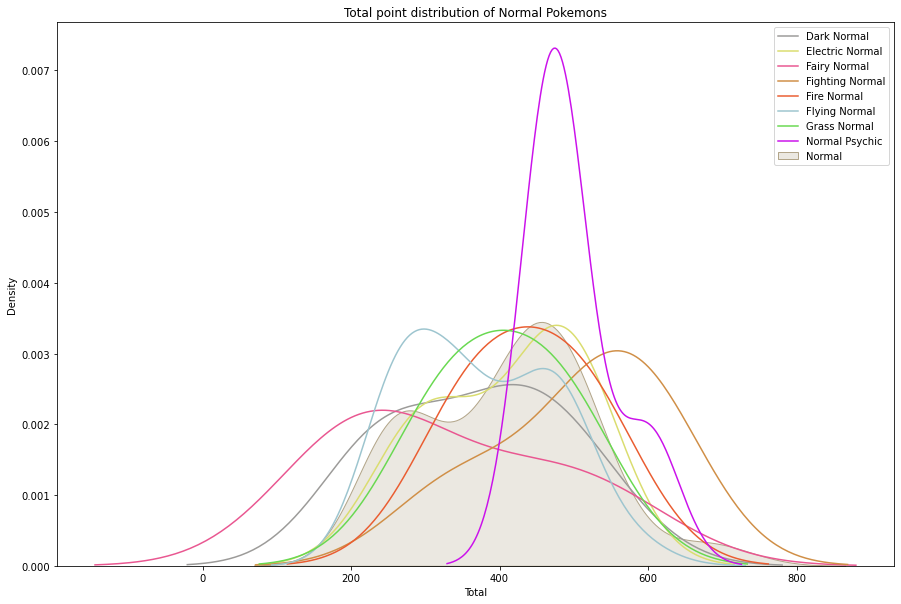

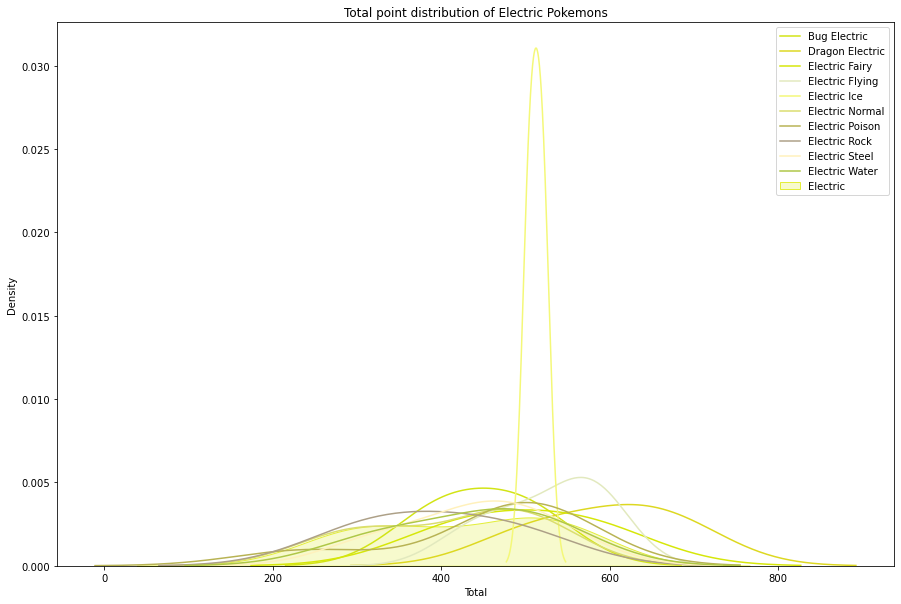

...

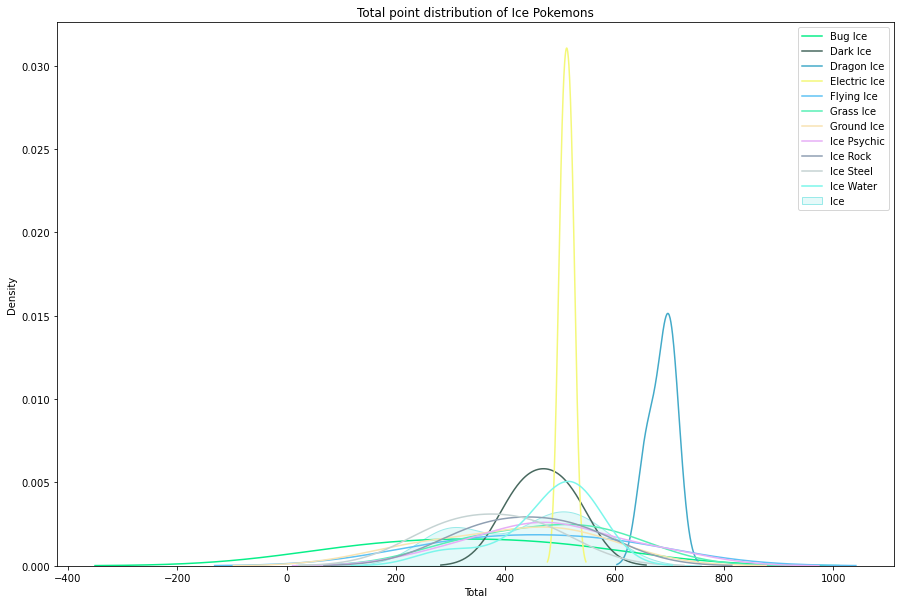

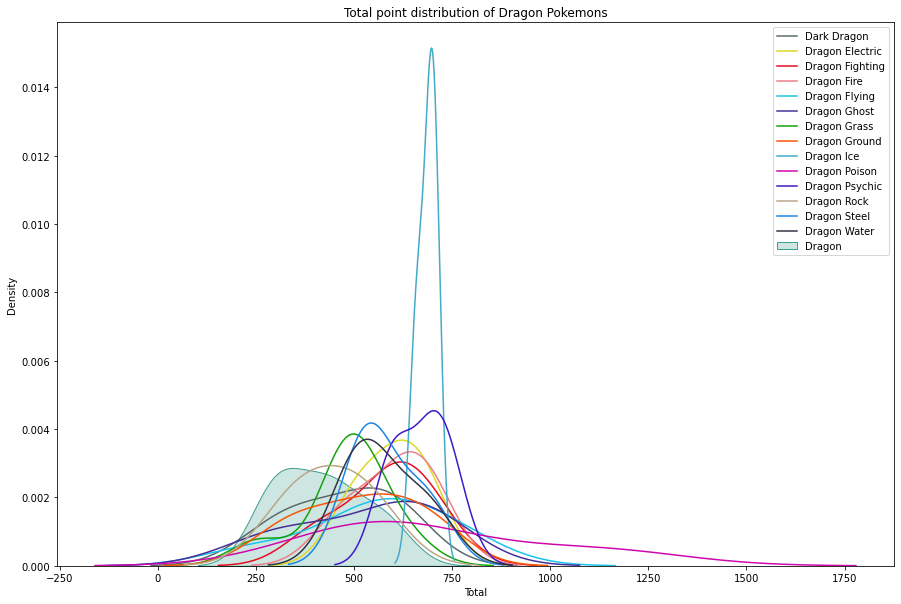

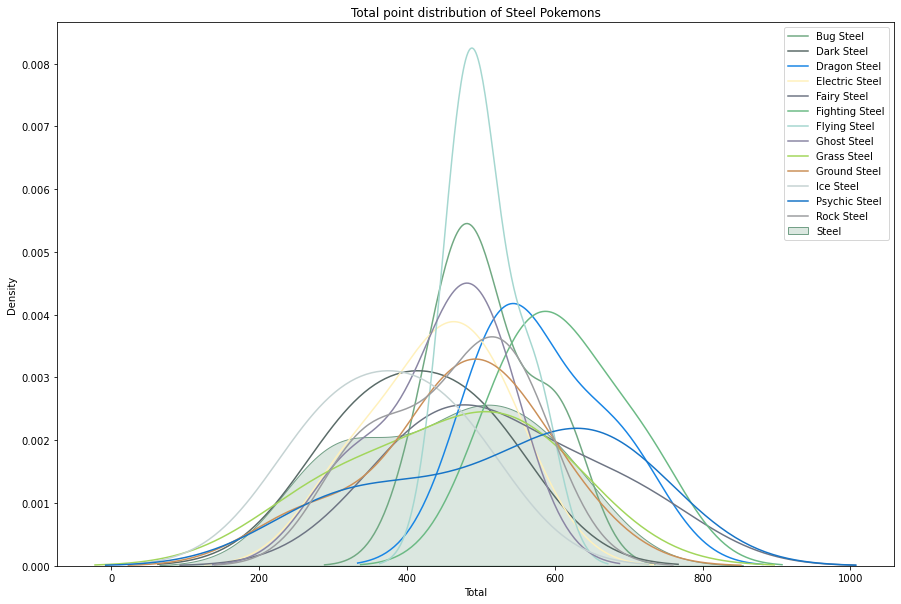

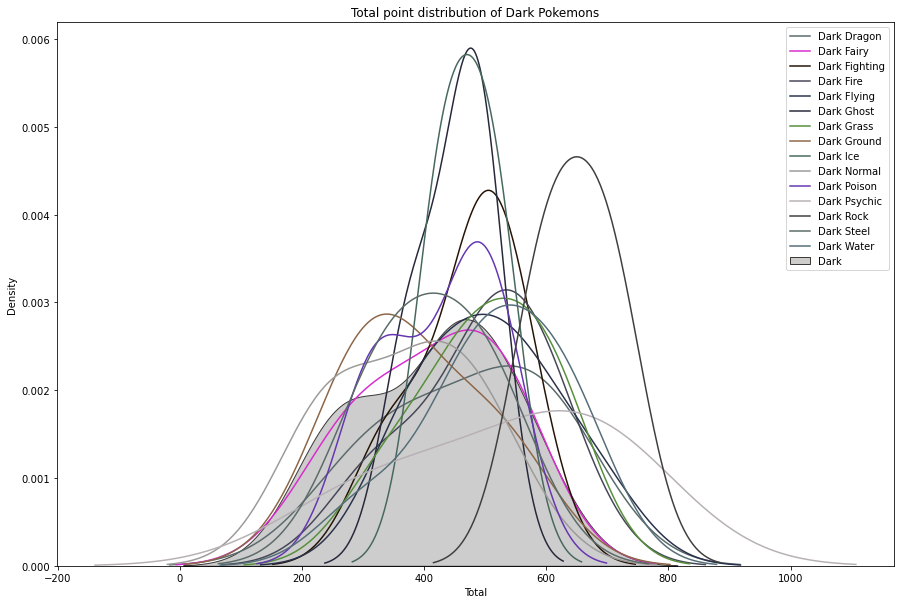

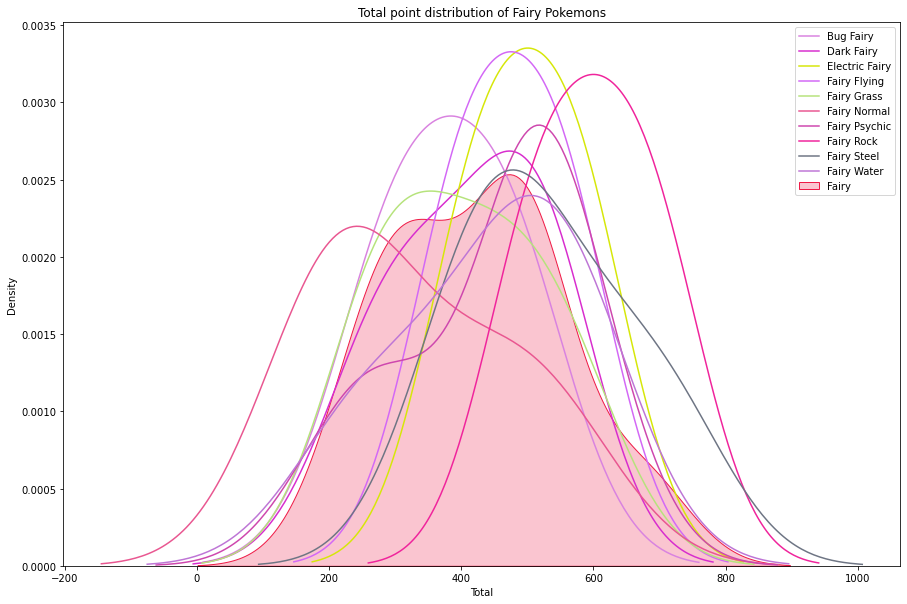

In [35]:
show_pure_type('Grass')
show_pure_type('Fire')
show_pure_type('Water')
show_pure_type('Normal')
show_pure_type('Electric')
show_pure_type('Fighting')
show_pure_type('Flying')
show_pure_type('Ground')
show_pure_type('Rock')
show_pure_type('Bug')
show_pure_type('Poison')
show_pure_type('Psychic')
show_pure_type('Ghost')
show_pure_type('Ice')
show_pure_type('Dragon')
show_pure_type('Steel')
show_pure_type('Dark')
show_pure_type('Fairy')

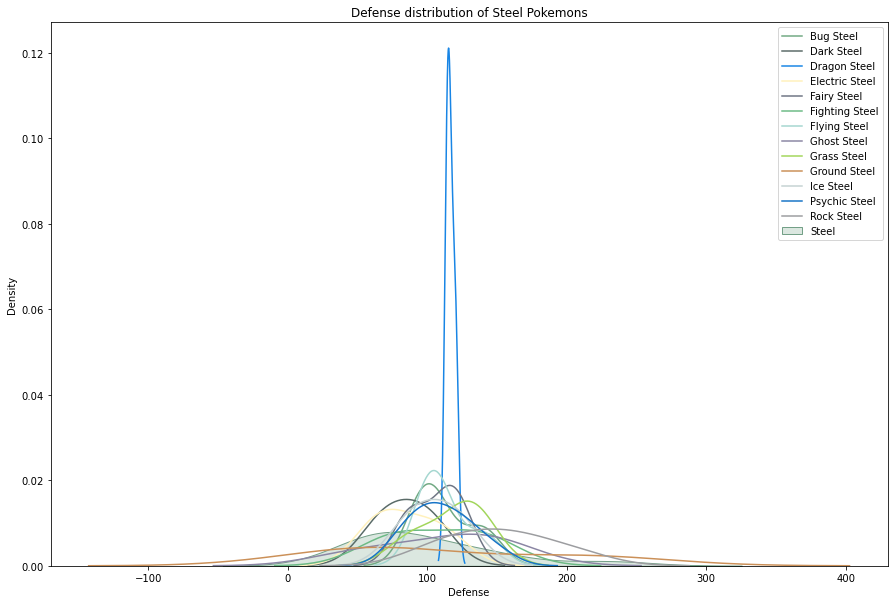

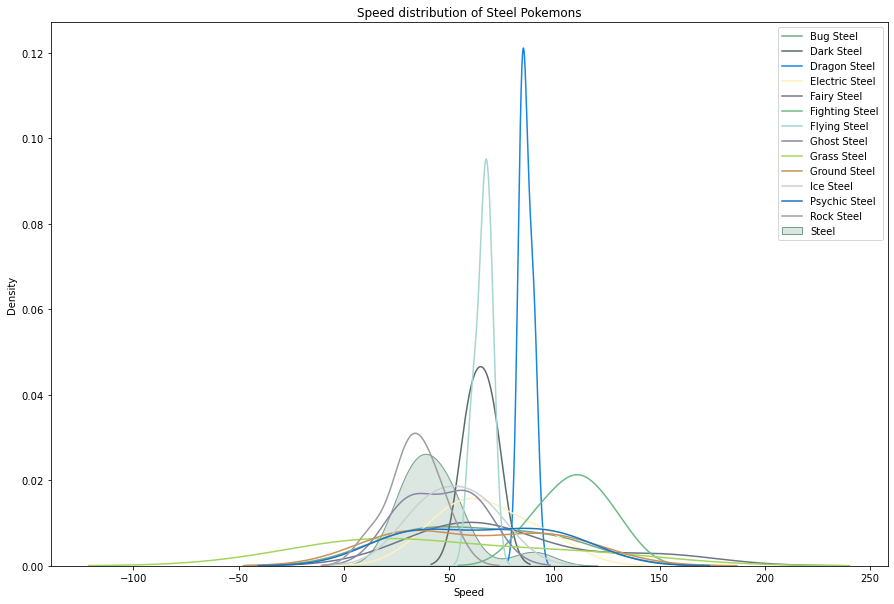

In [36]:
show_pure_type('Steel', 'Defense')
show_pure_type('Steel', 'Speed')

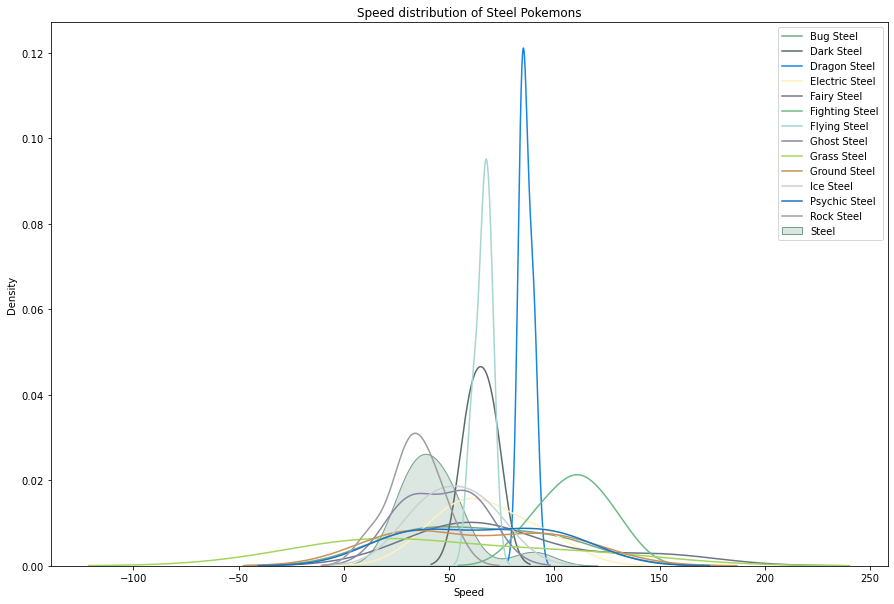

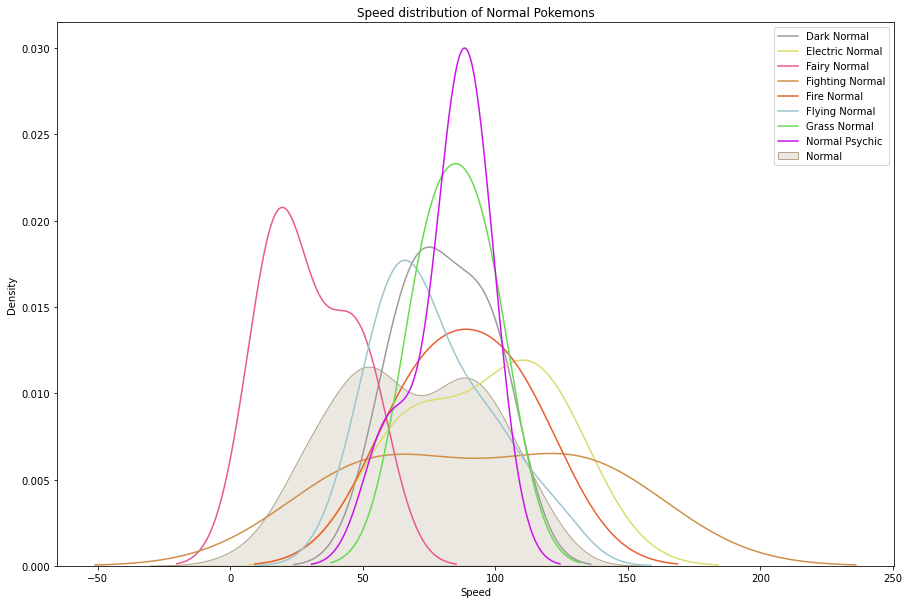

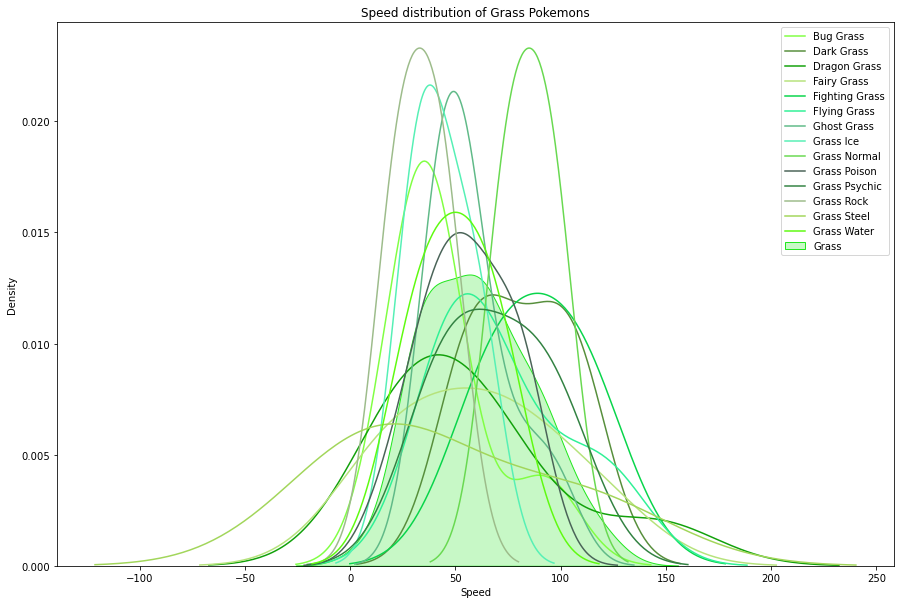

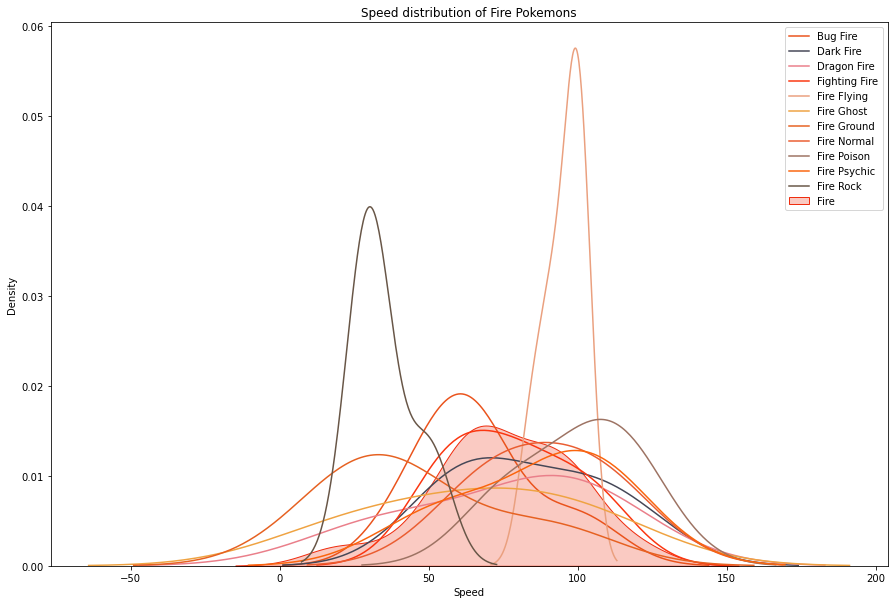

In [37]:
show_pure_type('Steel', 'Speed')
show_pure_type('Normal', 'Speed')
show_pure_type('Grass', 'Speed')
show_pure_type('Fire', 'Speed')

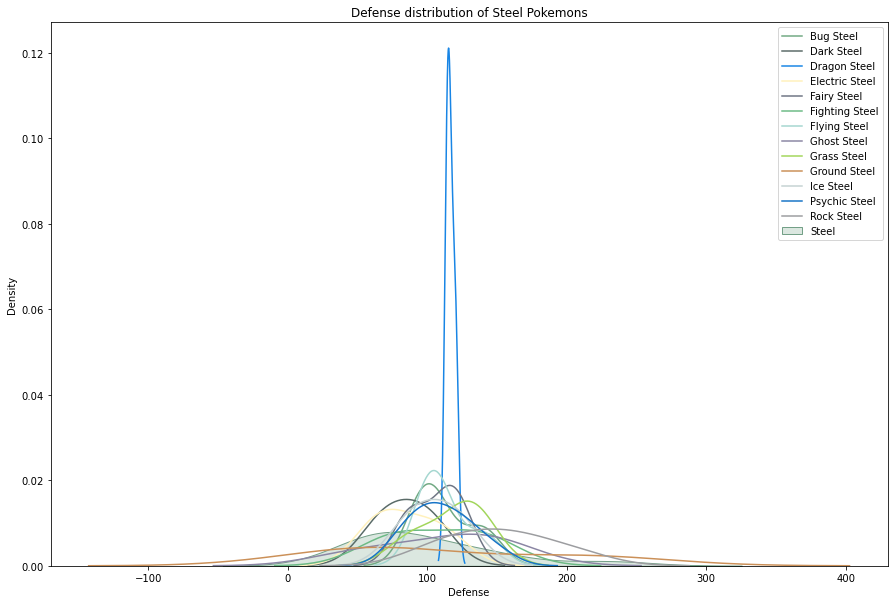

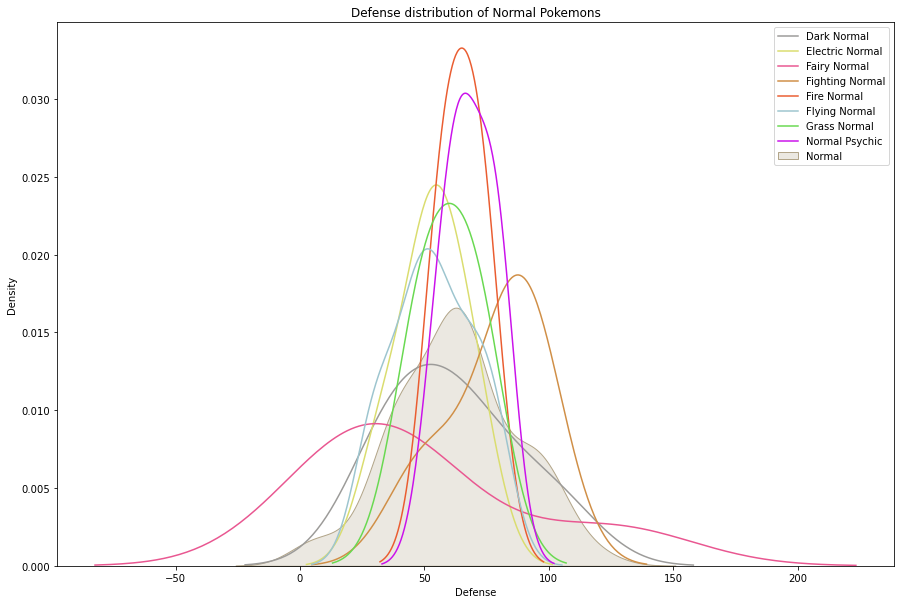

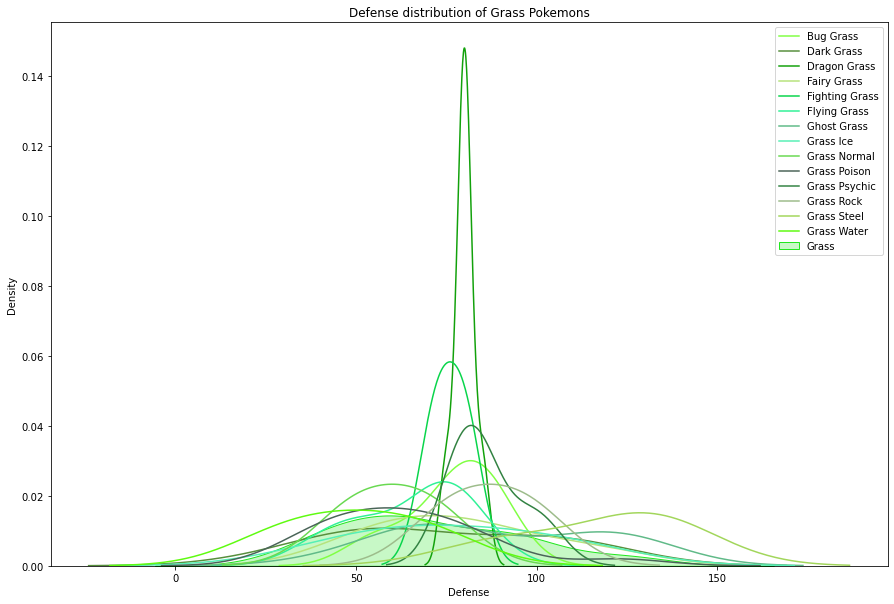

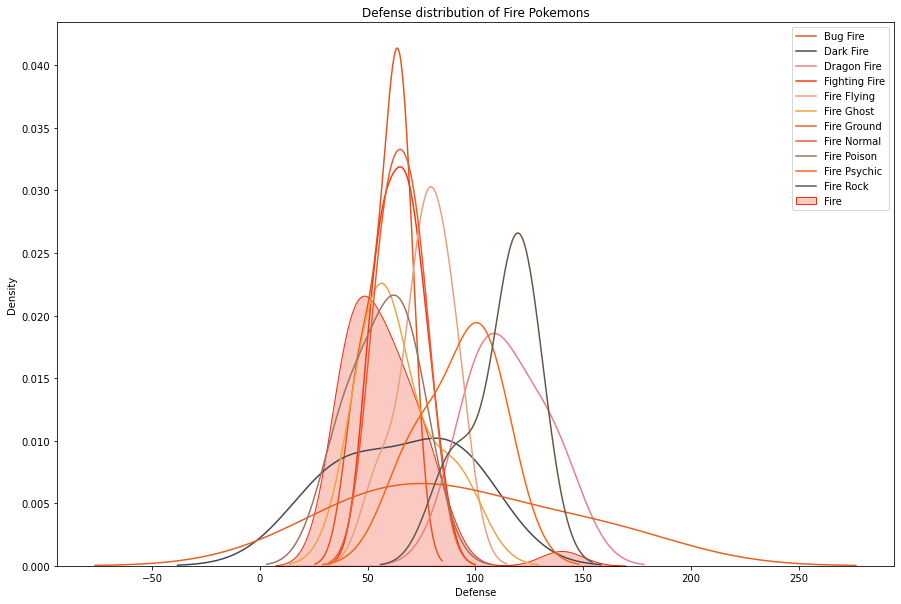

In [38]:
show_pure_type('Steel', 'Defense')
show_pure_type('Normal', 'Defense')
show_pure_type('Grass', 'Defense')
show_pure_type('Fire', 'Defense')

# Mythical and Legendary Pokemon

In [39]:
mythical_df = pokedex_df[pokedex_df['Mythical'] == 1]
not_mythical_df = pokedex_df[~(pokedex_df['Mythical'] == 1)]
legendary_df = pokedex_df[pokedex_df['Legendary'] == 1]
not_legendary_df = pokedex_df[~(pokedex_df['Legendary'] == 1)]
mythical_legendary_df = pokedex_df[(pokedex_df['Mythical'] == 1) | (pokedex_df['Legendary'] == 1)]
normal_df = pokedex_df[~((pokedex_df['Mythical'] == 1) | (pokedex_df['Legendary'] == 1))]

In [40]:
mythical_df['Type 1'].value_counts()

Psychic     9
Water       4
Steel       4
Normal      3
Dark        3
Grass       2
Rock        2
Fighting    1
Fire        1
Bug         1
Electric    1
Name: Type 1, dtype: int64

In [41]:
mythical_df['Type 2'].value_counts()

            13
Fighting     3
Fairy        3
Grass        3
Psychic      2
Ghost        2
Flying       1
Fire         1
Dark         1
Water        1
Steel        1
Name: Type 2, dtype: int64

In [42]:
mythical_df['Combined Type'].value_counts()

Psychic            5
Fairy Rock         2
Dark Grass         2
Fighting Water     2
Water              2
Steel              2
Bug Steel          1
Psychic Steel      1
Dark               1
Fairy Steel        1
Fire Water         1
Grass Psychic      1
Normal             1
Fighting Ghost     1
Electric           1
Grass              1
Fighting Normal    1
Flying Grass       1
Fire Psychic       1
Normal Psychic     1
Dark Psychic       1
Ghost Psychic      1
Name: Combined Type, dtype: int64

In [43]:
legendary_df['Type 1'].value_counts()

Psychic     20
Dragon      13
Fighting     8
Electric     6
Water        5
Ground       4
Fire         4
Normal       3
Ghost        3
Fairy        3
Steel        3
Ice          2
Rock         2
Dark         2
Grass        2
Flying       2
Name: Type 1, dtype: int64

In [44]:
legendary_df['Type 2'].value_counts()

            32
Flying      12
Fighting     5
Dragon       5
Steel        5
Fairy        4
Psychic      4
Ground       3
Water        3
Ghost        2
Fire         2
Dark         2
Ice          1
Electric     1
Grass        1
Name: Type 2, dtype: int64

In [45]:
legendary_df['Combined Type'].value_counts()

Psychic            10
Dragon Psychic      5
Electric Flying     3
Fighting Water      3
Dragon Ground       3
Normal              3
Water               3
Ghost Psychic       2
Electric            2
Dragon Flying       2
Fighting Steel      2
Fighting Ground     2
Ice                 2
Psychic Steel       2
Fire Flying         2
Dragon              2
Flying              2
Dark Flying         2
Fighting            2
Dragon Ghost        2
Fairy               2
Electric Fairy      1
Steel               1
Fighting Rock       1
Fighting Grass      1
Dragon Water        1
Fairy Grass         1
Fairy Psychic       1
Fairy Steel         1
Ice Psychic         1
Dragon Fire         1
Fire                1
Ground              1
Flying Psychic      1
Fire Steel          1
Dragon Electric     1
Fairy Water         1
Fire Ground         1
Grass Psychic       1
Flying Rock         1
Fighting Flying     1
Dragon Steel        1
Dark Psychic        1
Dark Fighting       1
Ghost               1
Name: Comb

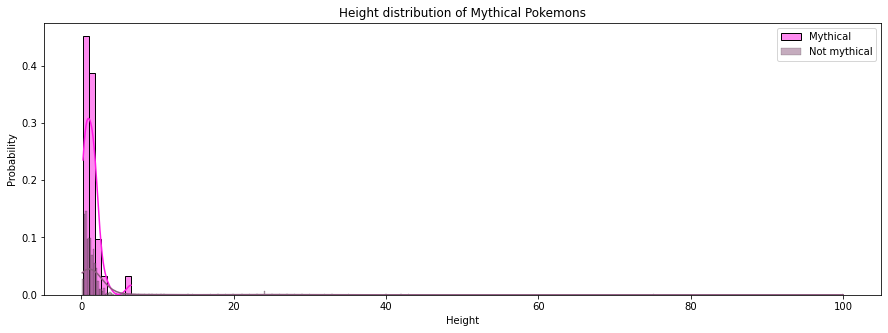

In [46]:
plt.figure(figsize=(15,5))
plt.title('Height distribution of Mythical Pokemons')
sns.histplot(x=mythical_df['Height'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=not_mythical_df['Height'], 
                 kde=True, stat='probability', label='Not mythical', color='#8D5B7F')
plt.legend()
plt.show()

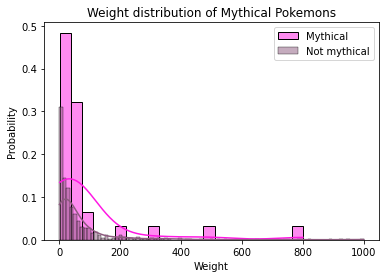

In [47]:
plt.title('Weight distribution of Mythical Pokemons')
sns.histplot(x=mythical_df['Weight'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=not_mythical_df['Weight'], 
                 kde=True, stat='probability', label='Not mythical', color='#8D5B7F')
plt.legend()
plt.show()

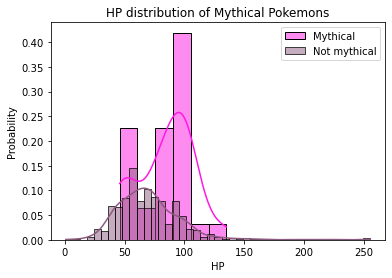

In [48]:
plt.title('HP distribution of Mythical Pokemons')
sns.histplot(x=mythical_df['HP'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=not_mythical_df['HP'], 
                 kde=True, stat='probability', label='Not mythical', color='#8D5B7F')
plt.legend()
plt.show()

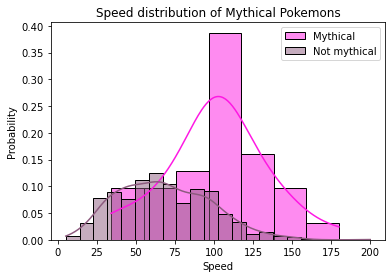

In [49]:
plt.title('Speed distribution of Mythical Pokemons')
sns.histplot(x=mythical_df['Speed'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=not_mythical_df['Speed'], 
                 kde=True, stat='probability', label='Not mythical', color='#8D5B7F')
plt.legend()
plt.show()

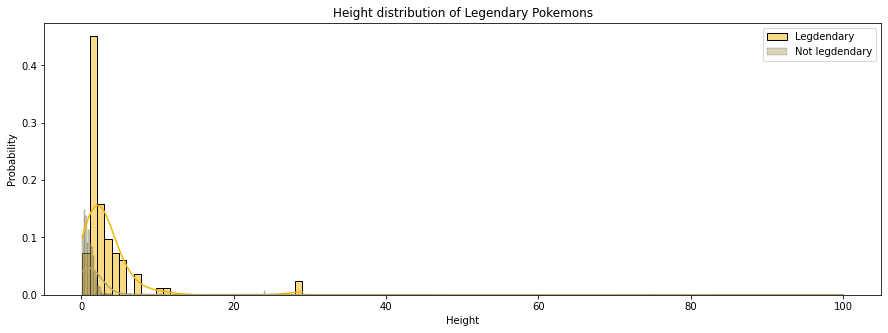

In [50]:
plt.figure(figsize=(15,5))
plt.title('Height distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Height'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=not_legendary_df['Height'], 
                 kde=True, stat='probability', label='Not legdendary', color='#B3A86A')
plt.legend()
plt.show()

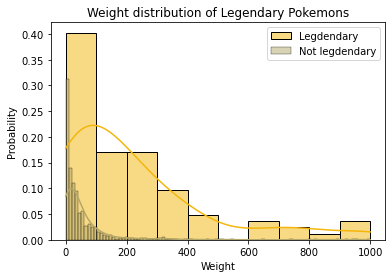

In [51]:
plt.title('Weight distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Weight'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=not_legendary_df['Weight'], 
                 kde=True, stat='probability', label='Not legdendary', color='#B3A86A')
plt.legend()
plt.show()

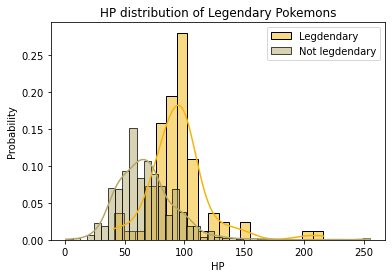

In [52]:
plt.title('HP distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['HP'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=not_legendary_df['HP'], 
                 kde=True, stat='probability', label='Not legdendary', color='#B3A86A')
plt.legend()
plt.show()

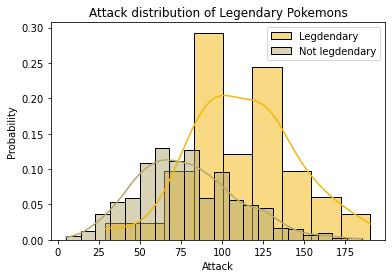

In [53]:
plt.title('Attack distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Attack'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=not_legendary_df['Attack'], 
                 kde=True, stat='probability', label='Not legdendary', color='#B3A86A')
plt.legend()
plt.show()

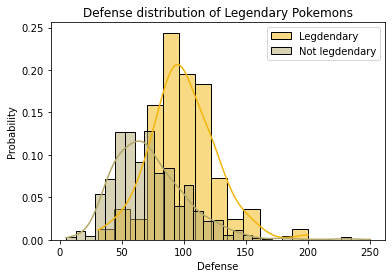

In [54]:
plt.title('Defense distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Defense'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=not_legendary_df['Defense'], 
                 kde=True, stat='probability', label='Not legdendary', color='#B3A86A')
plt.legend()
plt.show()

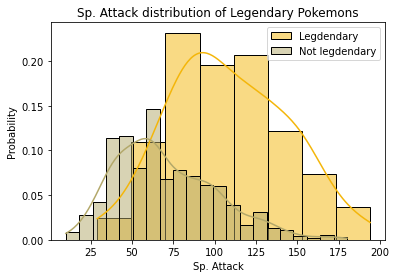

In [55]:
plt.title('Sp. Attack distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Sp. Attack'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=not_legendary_df['Sp. Attack'], 
                 kde=True, stat='probability', label='Not legdendary', color='#B3A86A')
plt.legend()
plt.show()

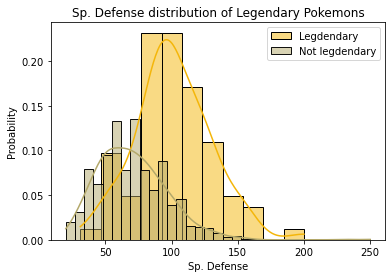

In [56]:
plt.title('Sp. Defense distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Sp. Defense'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=not_legendary_df['Sp. Defense'], 
                 kde=True, stat='probability', label='Not legdendary', color='#B3A86A')
plt.legend()
plt.show()

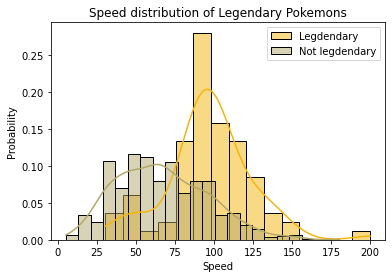

In [57]:
plt.title('Speed distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Speed'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=not_legendary_df['Speed'], 
                 kde=True, stat='probability', label='Not legdendary', color='#B3A86A')
plt.legend()
plt.show()

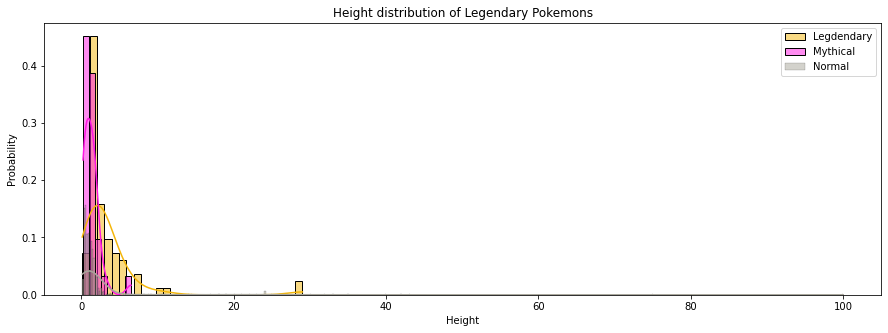

In [58]:
plt.figure(figsize=(15,5))
plt.title('Height distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Height'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['Height'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['Height'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

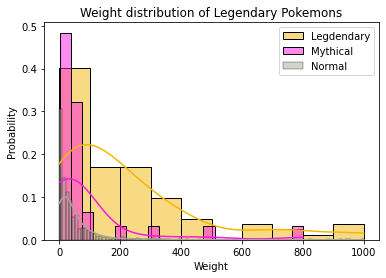

In [59]:
plt.title('Weight distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Weight'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['Weight'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['Weight'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

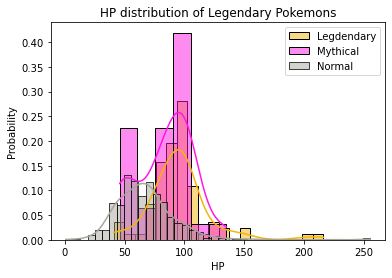

In [60]:
plt.title('HP distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['HP'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['HP'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['HP'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

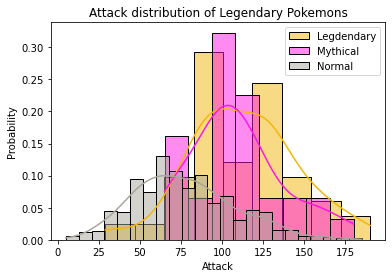

In [61]:
plt.title('Attack distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Attack'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['Attack'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['Attack'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

In [62]:
t_attack_legend, p_attack_legend = ttest_ind(legendary_df['Attack'],normal_df['Speed'])
print(p_attack_legend)
t_attack_myth, p_attack_myth = ttest_ind(mythical_df['Attack'],normal_df['Speed'])
print(p_attack_myth)
t_attack_legend_myth, p_attack_legend_myth = ttest_ind(mythical_df['Attack'],legendary_df['Speed'])
print(p_attack_legend_myth)

4.788796201116679e-42
1.7321875541120916e-16
0.0418724056507894


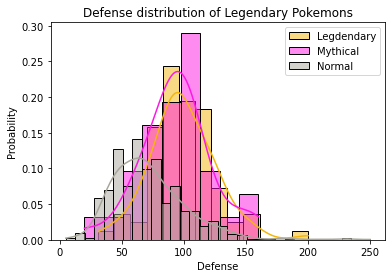

In [63]:
plt.title('Defense distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Defense'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['Defense'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['Defense'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

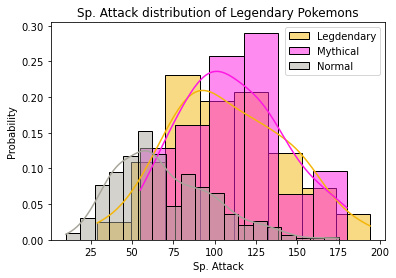

In [64]:
plt.title('Sp. Attack distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Sp. Attack'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['Sp. Attack'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['Sp. Attack'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

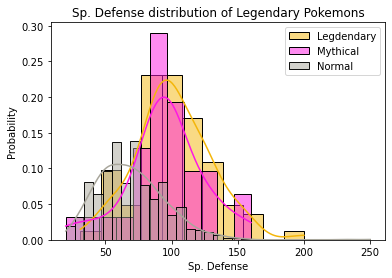

In [65]:
plt.title('Sp. Defense distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Sp. Defense'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['Sp. Defense'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['Sp. Defense'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

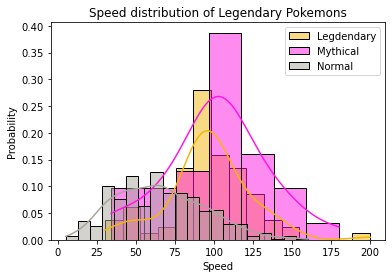

In [66]:
plt.title('Speed distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Speed'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['Speed'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['Speed'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

In [67]:
t_speed_legend, p_speed_legend = ttest_ind(legendary_df['Speed'],normal_df['Speed'])
print(p_speed_legend)
t_speed_myth, p_speed_myth = ttest_ind(mythical_df['Speed'],normal_df['Speed'])
print(p_speed_myth)
t_speed_legend_myth, p_speed_legend_myth = ttest_ind(mythical_df['Speed'],legendary_df['Speed'])
print(p_speed_legend_myth)

2.970274361549221e-21
8.76686365175991e-12
0.46370721808449655


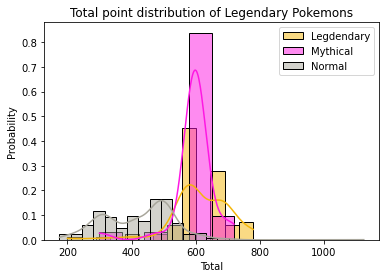

In [68]:
plt.title('Total point distribution of Legendary Pokemons')
sns.histplot(x=legendary_df['Total'], 
                 kde=True, stat='probability', label='Legdendary', color='#F4B60A')
sns.histplot(x=mythical_df['Total'], 
                 kde=True, stat='probability', label='Mythical', color='#FE18E3')
sns.histplot(x=normal_df['Total'], 
                 kde=True, stat='probability', label='Normal', color='#A8A69B')
plt.legend()
plt.show()

In [69]:
t_total_legend, p_total_legend = ttest_ind(legendary_df['Total'],normal_df['Speed'])
print(p_total_legend)
t_total_myth, p_total_myth = ttest_ind(mythical_df['Total'],normal_df['Speed'])
print(p_total_myth)
t_total_legend_myth, p_total_legend_myth = ttest_ind(mythical_df['Total'],legendary_df['Speed'])
print(p_total_legend_myth)

0.0
0.0
1.807656838575757e-83


# Correlation

The correlation matrix plot shows that most features are very weakly correlated. But the `'Total'` has some degree of correlation with its summing terms. Which is plausiable and we may ommit those sub-terms when building a model. 

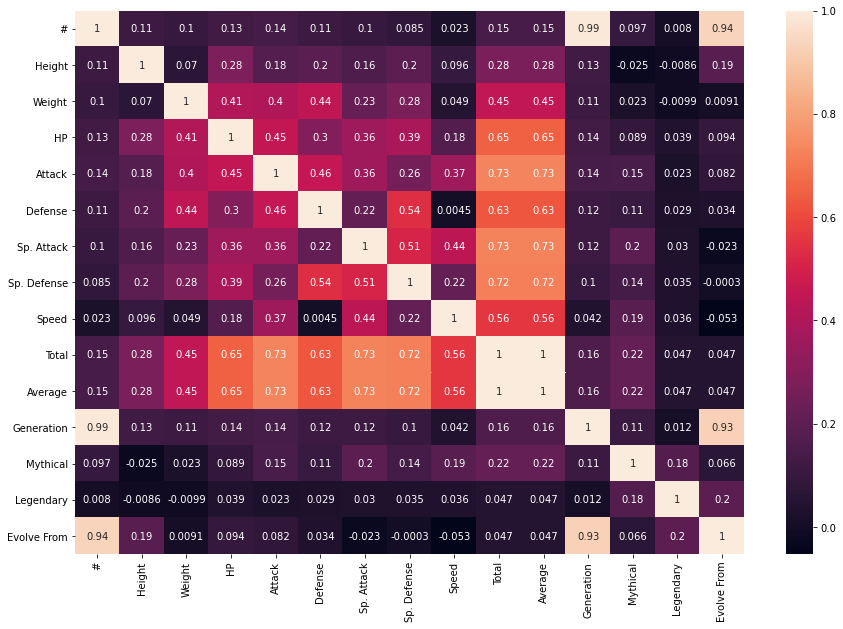

In [70]:
plt.figure(figsize=(15,10))
sns.heatmap(pokedex_df.corr(), annot = True)
plt.show()

# Outlier

Finally, let's look into outliers. 

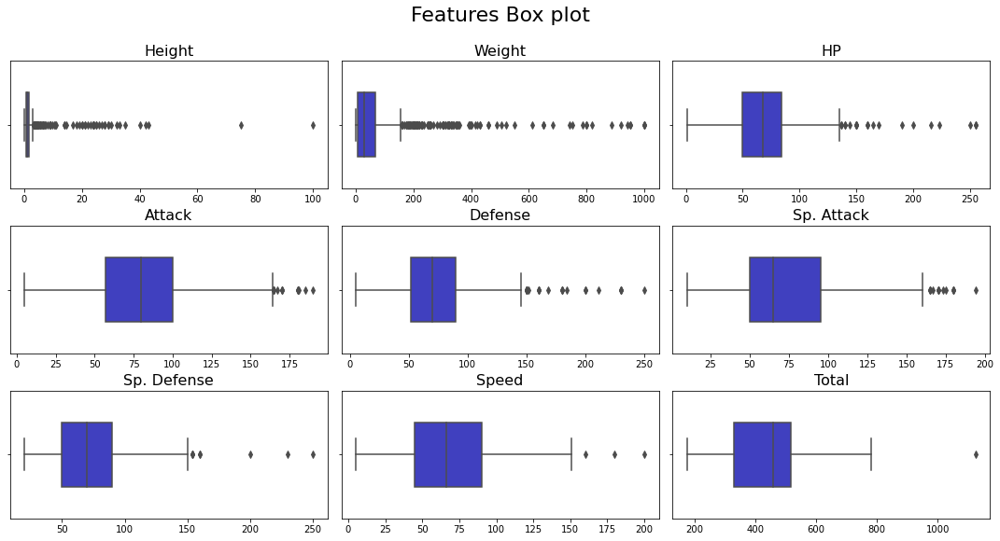

In [90]:
# Code from https://www.kaggle.com/muhammadmelsherbini/jane-street-extensive-eda-pca-starter#Features-data-analysis
fig = plt.figure(figsize=(15,9))
fig.suptitle('Features Box plot',fontsize=22, y=.89)
grid = gridspec.GridSpec(3,3,figure=fig,hspace=.5,wspace=.05)
target_cols = ['Height', 'Weight', 'HP', 'Attack', 'Defense', 'Sp. Attack', 'Sp. Defense', 'Speed', 'Total']
counter = 0

for i in range(3): 
    for j in range(3): 
        subf = fig.add_subplot(grid[i, j])
        sns.boxplot(x= pokedex_df[target_cols[counter]],saturation=.5,color= 'blue', ax= subf,width=.5)
        subf.set_xlabel('')
        subf.set_title('{}'.format(target_cols[counter]),fontsize=16)
        counter += 1

grid.tight_layout(fig)
grid.update(top=0.8)
plt.show()